# İŞ PROBLEMİ

Maaş bilgileri ve 1986 yılına ait kariyer istatistikleri paylaşılan beyzbol oyuncularının maaş tahminleri için bir makine öğrenmesi modeli geliştirilmesi istenmektedir.

# Veri Seti Hikayesi

Bu veri seti orijinal olarak Carnegie Mellon Üniversitesi'nde bulunan StatLib kütüphanesinden alınmıştır.Veri seti 1988 ASA Grafik Bölümü Poster Oturumu'nda kullanılan verilerin bir parçasıdır.Maaş verileri orijina olarak Sports Illustrated,20 Nisan 1987'den alınmıştır.1986 ve kariyer istatistikleri,Collier Books,Macmillan Publishing Company,New York tarafından yayınlanan 1987 Beyzbol Ansiklopedisi Güncellesinden elde edilmiştir.

Beyzbolda "A" ve "N" seviyeleri, bir oyuncunun o sezon içinde oynadığı ligi belirtmek için kullanılan kısaltmalardır.

* A: American League (Amerikan Ligi)
* N: National League (Ulusal Lig)

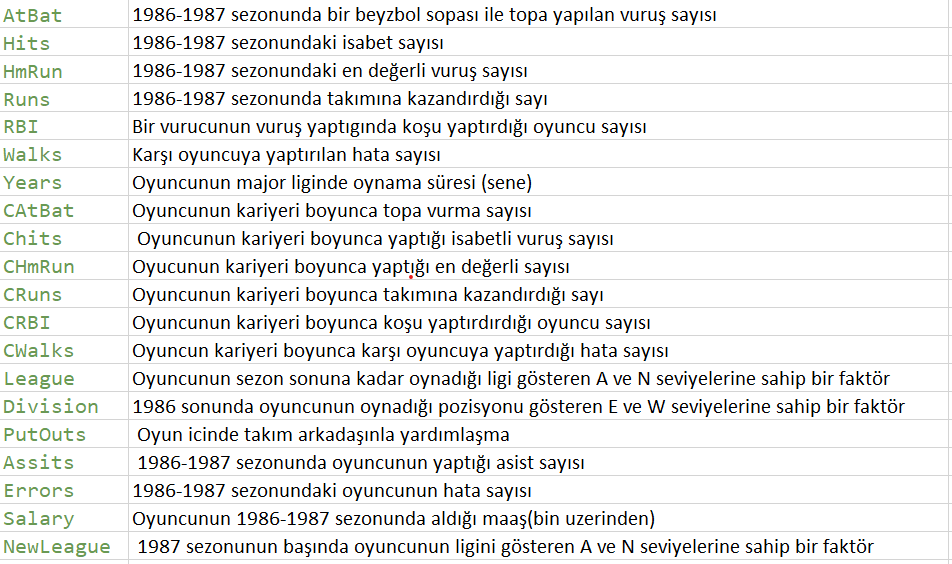


Beyzbolda E ve W seviyeleri, bir oyuncunun o sezon içinde oynadığı bölümü (division) ifade eder. Bu, oyuncunun takımının hangi coğrafi bölgede yer aldığını gösterir.

* E: Eastern Division (Doğu Bölümü)
* W: Western Division (Batı Bölümü)

In [4]:
import numpy as np
import warnings
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler, RobustScaler

from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, cross_val_score, validation_curve

from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 170)
pd.set_option('display.max_rows', 20)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Updated import for SettingWithCopyWarning
from pandas.errors import SettingWithCopyWarning
from sklearn.exceptions import ConvergenceWarning

warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action="ignore", category=ConvergenceWarning)
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)


In [7]:
import pandas as pd

# Load the dataset
df = pd.read_csv("/kaggle/input/hitter/hitters.csv")

def check_df(dataframe, head=5):
    print("##################### Shape #####################")
    print(dataframe.shape)

    print("##################### Types #####################")
    print(dataframe.dtypes)

    print("##################### Head #####################")
    print(dataframe.head(head))

    print("##################### Tail #####################")
    print(dataframe.tail(head))

    print("##################### NA #####################")
    print(dataframe.isnull().sum())

    print("##################### Quantiles #####################")
    
    # Select only numeric columns for quantile calculation
    numeric_cols = dataframe.select_dtypes(include=['float64', 'int64']).columns
    print(dataframe[numeric_cols].quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)

# Run the function
check_df(df)


##################### Shape #####################
(322, 20)
##################### Types #####################
AtBat          int64
Hits           int64
HmRun          int64
Runs           int64
RBI            int64
Walks          int64
Years          int64
CAtBat         int64
CHits          int64
CHmRun         int64
CRuns          int64
CRBI           int64
CWalks         int64
League        object
Division      object
PutOuts        int64
Assists        int64
Errors         int64
Salary       float64
NewLeague     object
dtype: object
##################### Head #####################
   AtBat  Hits  HmRun  Runs  RBI  Walks  Years  CAtBat  CHits  CHmRun  CRuns  CRBI  CWalks League Division  PutOuts  Assists  Errors  Salary NewLeague
0    293    66      1    30   29     14      1     293     66       1     30    29      14      A        E      446       33      20     NaN         A
1    315    81      7    24   38     39     14    3449    835      69    321   414     375      N        

In [10]:
def grab_col_names(dataframe, cat_th=10, car_th=20):
    """
    Grabs column names by categories, numerical and categorical but cardinal.
    
    Parameters
    ----------
    dataframe: dataframe
        The dataframe from which to grab the column names.
    cat_th: int, optional
        The threshold for numerical columns to be considered categorical.
    car_th: int, optional
        The threshold for categorical columns to be considered cardinal.
        
    Returns
    -------
    cat_cols: list
        List of categorical column names.
    num_cols: list
        List of numerical column names.
    cat_but_car: list
        List of cardinal categorical column names.
    """

    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    
    return cat_cols, num_cols, cat_but_car

# Now you can call the function
cat_cols, num_cols, cat_but_car = grab_col_names(df)


Observations: 322
Variables: 20
cat_cols: 3
num_cols: 17
cat_but_car: 0


        League  Ratio
League               
A          175 54.348
N          147 45.652
##########################################


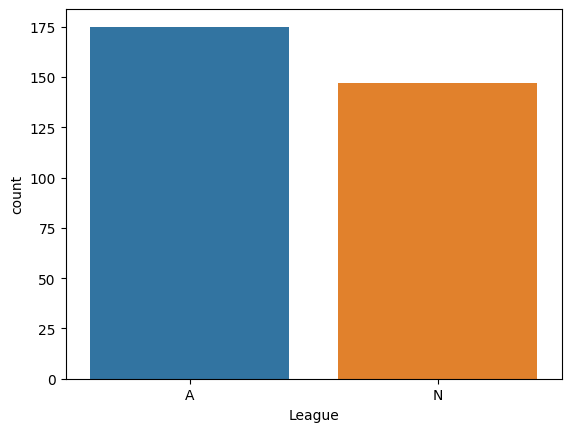

          Division  Ratio
Division                 
W              165 51.242
E              157 48.758
##########################################


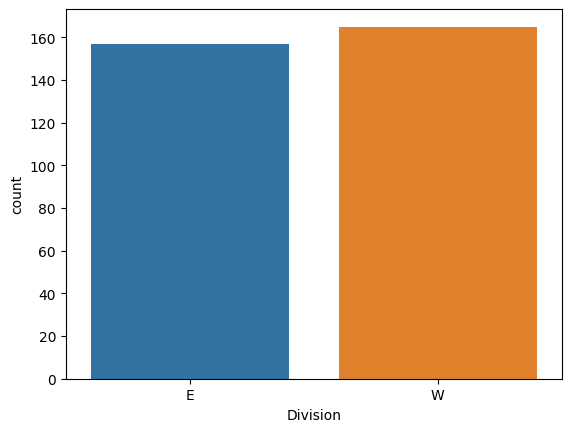

           NewLeague  Ratio
NewLeague                  
A                176 54.658
N                146 45.342
##########################################


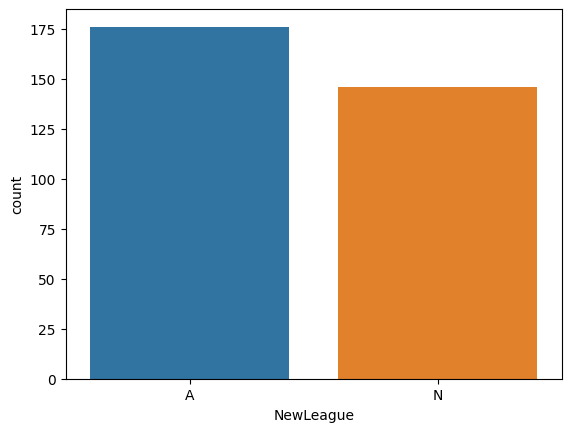

In [11]:
def cat_summary(dataframe, col_name, plot=False):

    print(pd.DataFrame({col_name: dataframe[col_name].value_counts(),
                        "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)}))
    print("##########################################")

    if plot:
        sns.countplot(x=dataframe[col_name], data=dataframe)
        plt.show()

for col in cat_cols:
    cat_summary(df, col, plot=True)

count   322.000
mean    380.929
std     153.405
min      16.000
5%      161.000
10%     194.100
20%     221.800
30%     281.300
40%     321.800
50%     379.500
60%     430.200
70%     490.000
80%     535.600
90%     584.900
95%     609.900
99%     658.590
max     687.000
Name: AtBat, dtype: float64


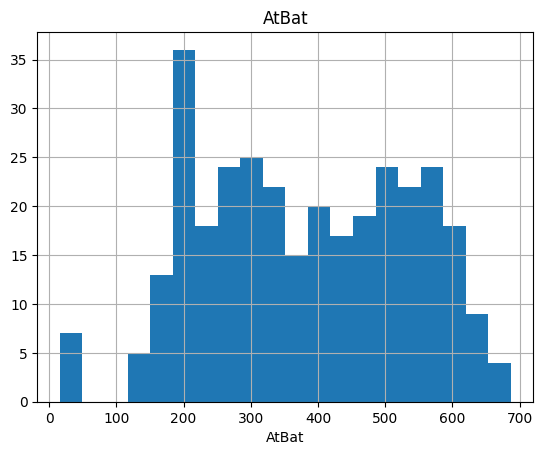

count   322.000
mean    101.025
std      46.455
min       1.000
5%       39.000
10%      45.100
20%      57.000
30%      70.000
40%      82.000
50%      96.000
60%     113.000
70%     128.700
80%     144.000
90%     163.000
95%     174.000
99%     210.790
max     238.000
Name: Hits, dtype: float64


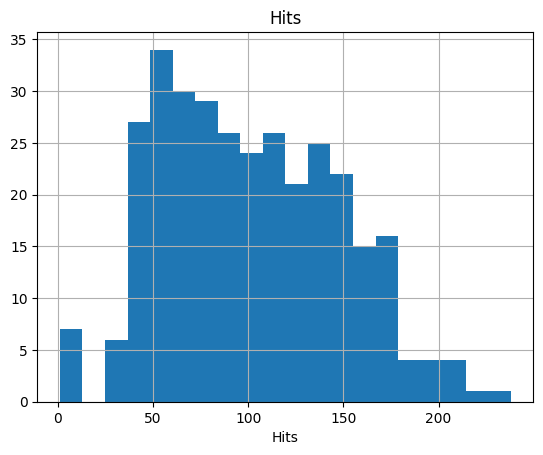

count   322.000
mean     10.770
std       8.709
min       0.000
5%        0.000
10%       1.000
20%       3.000
30%       5.000
40%       6.000
50%       8.000
60%      10.600
70%      14.000
80%      18.000
90%      24.000
95%      28.950
99%      33.000
max      40.000
Name: HmRun, dtype: float64


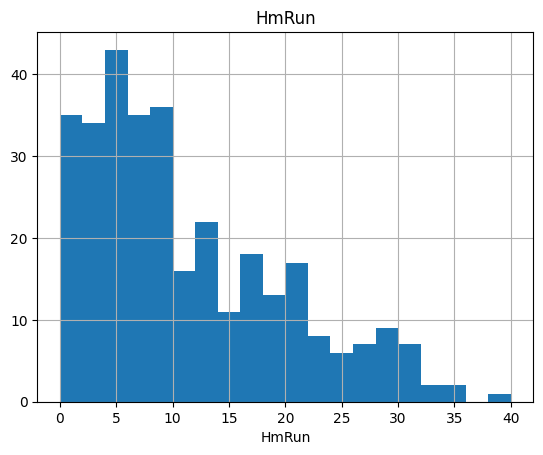

count   322.000
mean     50.910
std      26.024
min       0.000
5%       17.000
10%      20.100
20%      27.000
30%      33.000
40%      41.000
50%      48.000
60%      55.600
70%      66.000
80%      75.800
90%      89.000
95%      94.000
99%     107.790
max     130.000
Name: Runs, dtype: float64


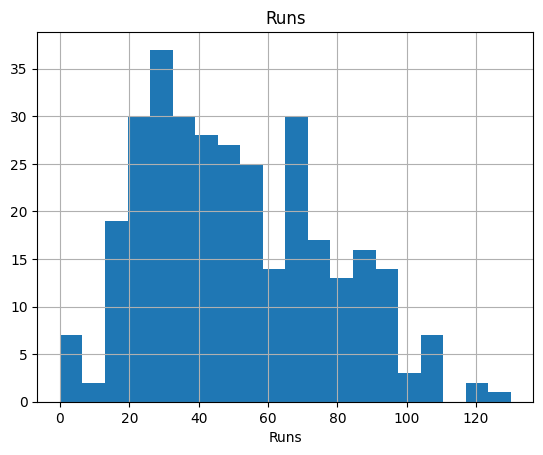

count   322.000
mean     48.028
std      26.167
min       0.000
5%       14.000
10%      19.000
20%      26.000
30%      30.000
40%      36.400
50%      44.000
60%      49.000
70%      58.000
80%      73.000
90%      86.000
95%      96.000
99%     112.370
max     121.000
Name: RBI, dtype: float64


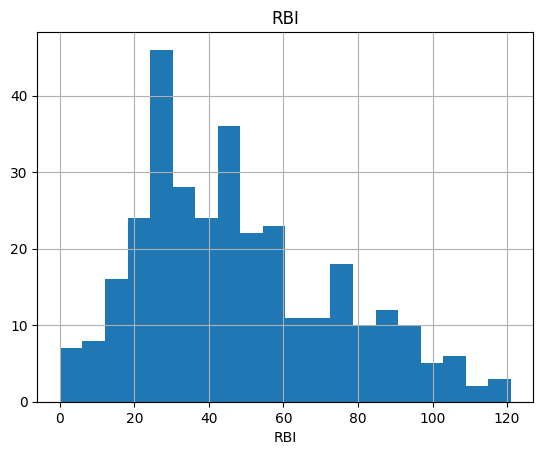

count   322.000
mean     38.742
std      21.639
min       0.000
5%       11.050
10%      15.000
20%      20.000
30%      24.000
40%      30.000
50%      35.000
60%      40.000
70%      48.700
80%      59.000
90%      69.900
95%      78.000
99%      93.580
max     105.000
Name: Walks, dtype: float64


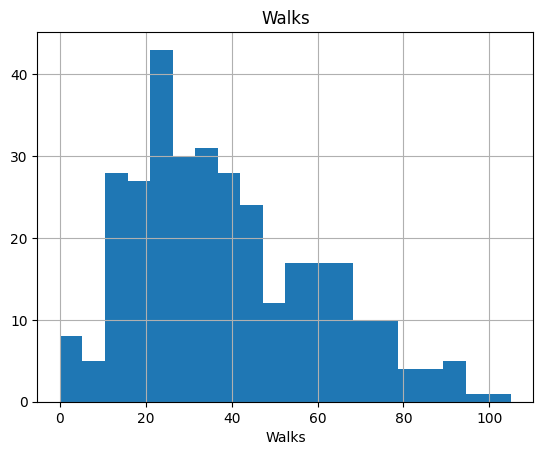

count   322.000
mean      7.444
std       4.926
min       1.000
5%        1.000
10%       2.000
20%       3.000
30%       4.000
40%       5.000
50%       6.000
60%       7.600
70%      10.000
80%      12.000
90%      15.000
95%      17.000
99%      19.790
max      24.000
Name: Years, dtype: float64


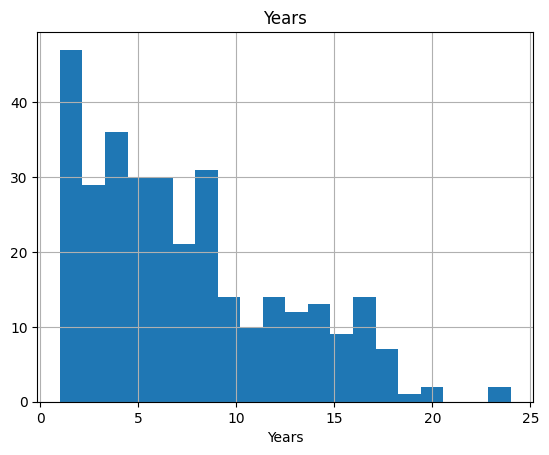

count     322.000
mean     2648.683
std      2324.206
min        19.000
5%        216.500
10%       342.200
20%       667.600
30%       963.400
40%      1402.200
50%      1928.000
60%      2654.000
70%      3365.000
80%      4483.000
90%      6123.400
95%      7125.600
99%      8749.970
max     14053.000
Name: CAtBat, dtype: float64


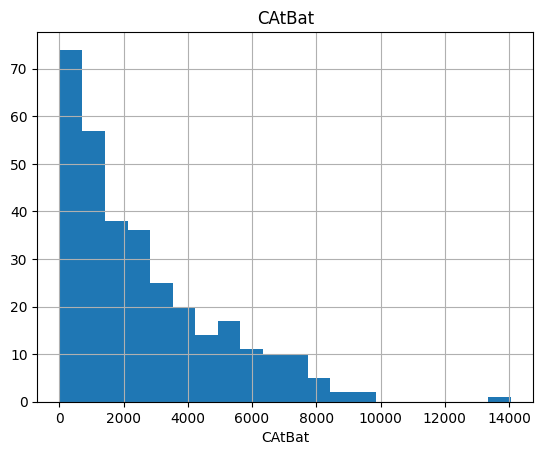

count    322.000
mean     717.571
std      654.473
min        4.000
5%        54.000
10%       86.000
20%      164.600
30%      238.000
40%      355.800
50%      508.000
60%      708.200
70%      911.100
80%     1229.200
90%     1659.600
95%     2017.150
99%     2500.340
max     4256.000
Name: CHits, dtype: float64


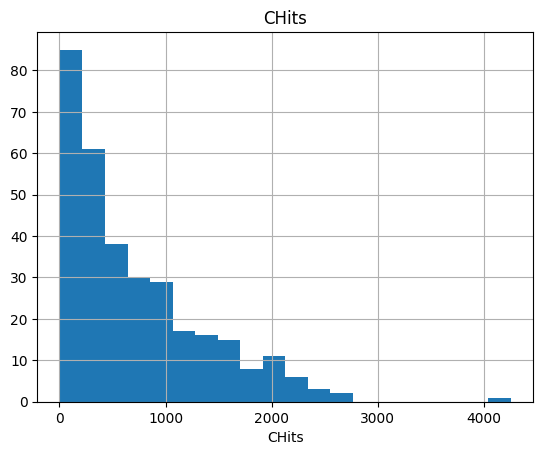

count   322.000
mean     69.491
std      86.266
min       0.000
5%        2.000
10%       4.000
20%      10.200
30%      16.300
40%      27.400
50%      37.500
60%      51.200
70%      72.400
80%     103.800
90%     194.900
95%     265.650
99%     373.120
max     548.000
Name: CHmRun, dtype: float64


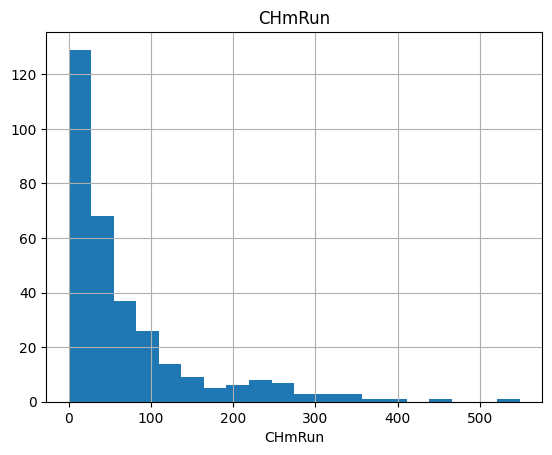

count    322.000
mean     358.795
std      334.106
min        1.000
5%        27.000
10%       38.100
20%       80.400
30%      117.300
40%      181.000
50%      247.000
60%      333.000
70%      443.400
80%      627.200
90%      895.700
95%     1032.300
99%     1174.370
max     2165.000
Name: CRuns, dtype: float64


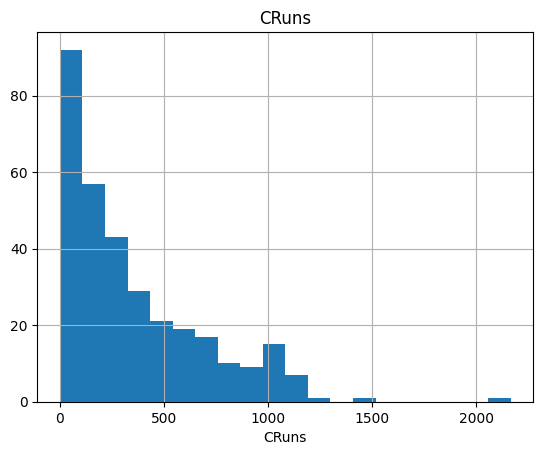

count    322.000
mean     330.118
std      333.220
min        0.000
5%        22.050
10%       34.100
20%       70.200
30%      106.300
40%      149.000
50%      220.500
60%      303.600
70%      379.100
80%      496.200
90%      861.600
95%     1071.750
99%     1310.850
max     1659.000
Name: CRBI, dtype: float64


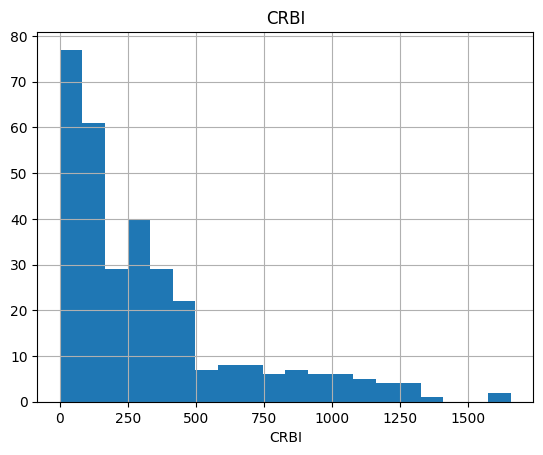

count    322.000
mean     260.239
std      267.058
min        0.000
5%        15.050
10%       30.100
20%       55.000
30%       82.000
40%      117.400
50%      170.500
60%      226.600
70%      300.700
80%      421.000
90%      643.900
95%      817.600
99%     1139.140
max     1566.000
Name: CWalks, dtype: float64


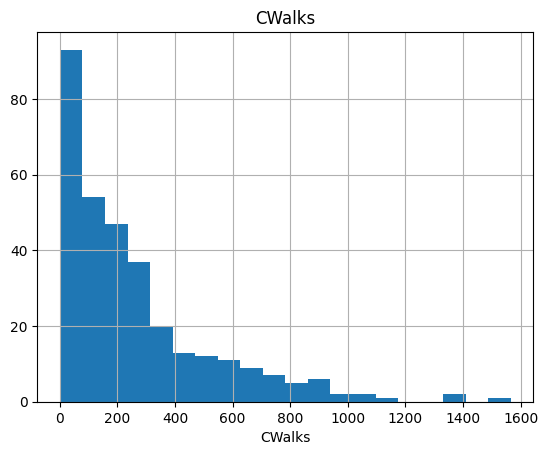

count    322.000
mean     288.938
std      280.705
min        0.000
5%        33.200
10%       62.200
20%       99.600
30%      132.000
40%      167.000
50%      212.000
60%      257.400
70%      303.000
80%      365.800
90%      685.600
95%      910.650
99%     1301.190
max     1378.000
Name: PutOuts, dtype: float64


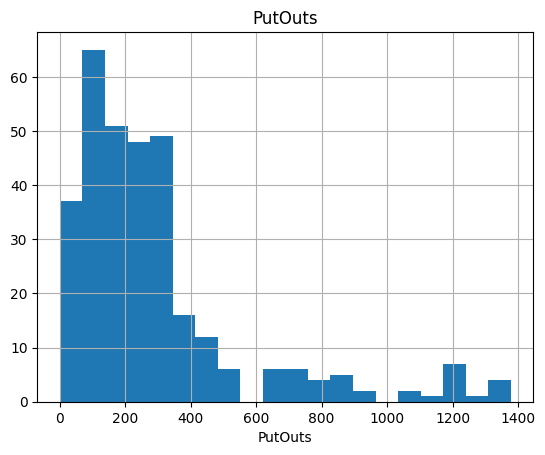

count   322.000
mean    106.913
std     136.855
min       0.000
5%        0.000
10%       2.000
20%       5.200
30%       9.000
40%      15.400
50%      39.500
60%      76.800
70%     134.800
80%     210.800
90%     353.300
95%     431.450
99%     478.160
max     492.000
Name: Assists, dtype: float64


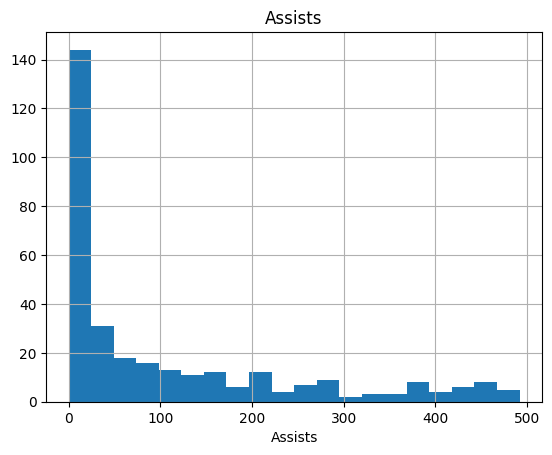

count   322.000
mean      8.040
std       6.368
min       0.000
5%        0.000
10%       1.000
20%       3.000
30%       4.000
40%       5.000
50%       6.000
60%       8.000
70%      10.000
80%      13.000
90%      17.000
95%      20.000
99%      25.790
max      32.000
Name: Errors, dtype: float64


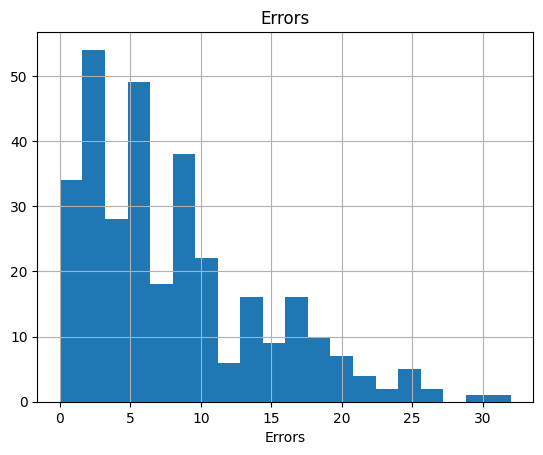

count    263.000
mean     535.926
std      451.119
min       67.500
5%        86.600
10%      100.000
20%      155.000
30%      221.000
40%      300.000
50%      425.000
60%      538.000
70%      700.000
80%      809.000
90%     1048.667
95%     1346.000
99%     2032.887
max     2460.000
Name: Salary, dtype: float64


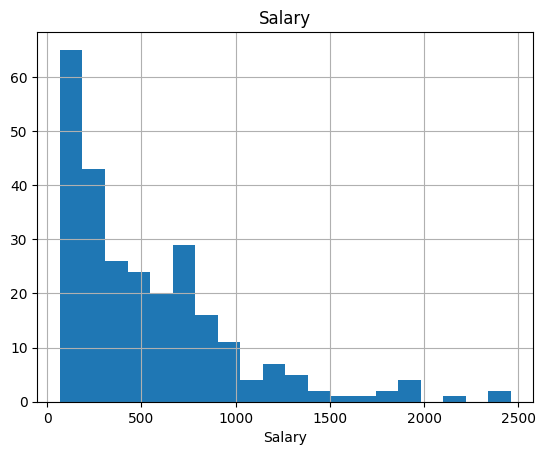

In [12]:
def num_summary(dataframe, numerical_col, plot=False):

    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]

    print(dataframe[numerical_col].describe(quantiles).T)

    if plot:
        dataframe[numerical_col].hist(bins=20)
        plt.xlabel(numerical_col)
        plt.title(numerical_col)
        plt.show()

for col in num_cols:
    num_summary(df, col, plot=True)


In [13]:
def target_summary_with_cat(dataframe, target, categorical_col):

    print(pd.DataFrame({"TARGET_MEAN": dataframe.groupby(categorical_col)[target].mean()}), end="\n\n\n")

for col in cat_cols:
    target_summary_with_cat(df, "Salary", col)

        TARGET_MEAN
League             
A           542.000
N           529.118


          TARGET_MEAN
Division             
E             624.271
W             450.877


           TARGET_MEAN
NewLeague             
A              537.113
N              534.554




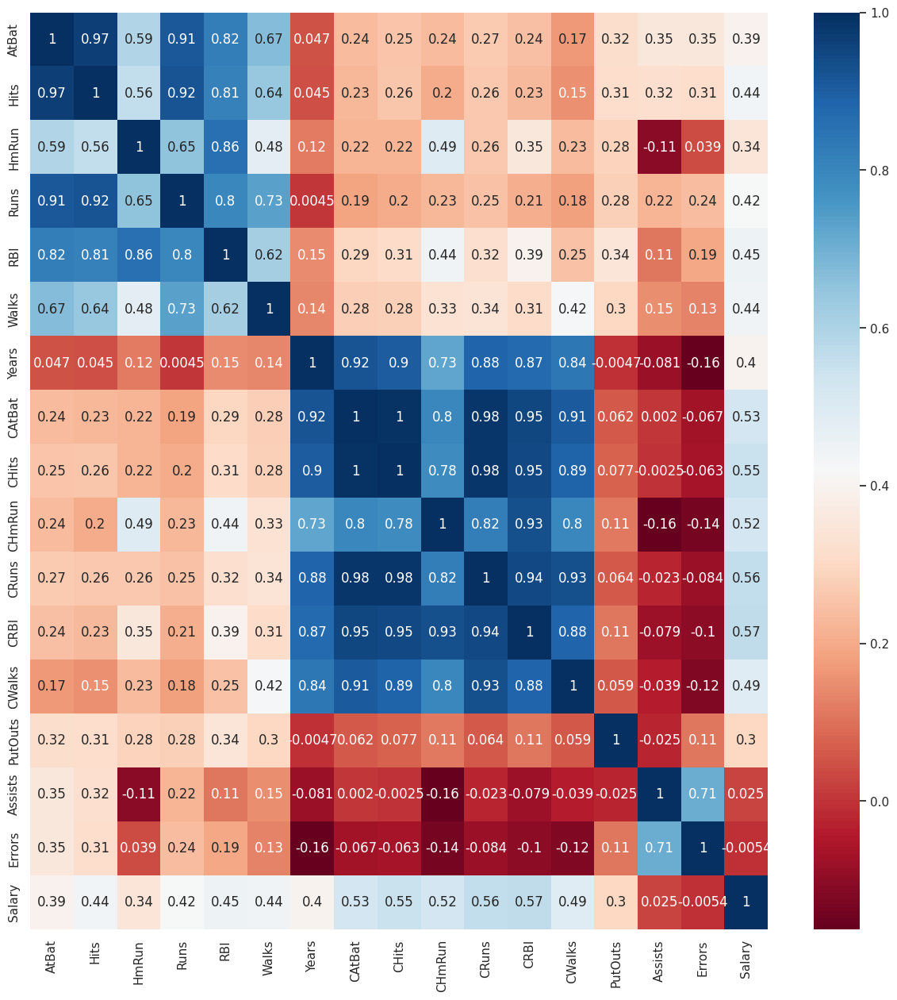

In [15]:
def high_correlated_cols(dataframe, plot=False, corr_th=0.90):
    # Select only the numeric columns
    numeric_df = dataframe.select_dtypes(include=[np.number])

    # Compute the correlation matrix
    corr = numeric_df.corr()

    # Compute the absolute values of the correlation matrix
    cor_matrix = corr.abs()

    # Create an upper triangle matrix to avoid duplicate correlations
    upper_triangle_matrix = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))

    # Identify columns with a high correlation
    drop_list = [col for col in upper_triangle_matrix.columns if any(upper_triangle_matrix[col] > corr_th)]

    # Plot the correlation matrix if requested
    if plot:
        import seaborn as sns
        import matplotlib.pyplot as plt
        sns.set(rc={'figure.figsize': (15, 15)})
        sns.heatmap(corr, cmap="RdBu", annot=True)
        plt.show()

    return drop_list

# Call the function
drop_list = high_correlated_cols(df, plot=True)


In [16]:
def outlier_thresholds(dataframe, col_name, q1=0.25, q3=0.75):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False

def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

for col in num_cols:
    print(col, check_outlier(df, col))

for col in num_cols:
    if check_outlier(df, col):
        replace_with_thresholds(df, col)

AtBat False
Hits False
HmRun True
Runs True
RBI True
Walks True
Years True
CAtBat True
CHits True
CHmRun True
CRuns True
CRBI True
CWalks True
PutOuts True
Assists True
Errors True
Salary True


In [17]:
def missing_values_table(dataframe, na_name=False):
    na_columns = [col for col in dataframe.columns if dataframe[col].isnull().sum() > 0]
    n_miss = dataframe[na_columns].isnull().sum().sort_values(ascending=False)
    ratio = (dataframe[na_columns].isnull().sum() / dataframe.shape[0] * 100).sort_values(ascending=False)
    missing_df = pd.concat([n_miss, np.round(ratio, 2)], axis=1, keys=['n_miss', 'ratio'])
    print(missing_df, end="\n")
    if na_name:
        return na_columns

missing_values_table(df)

df.dropna(inplace=True)

        n_miss  ratio
Salary      59 18.320


In [19]:
new_num_cols=[col for col in num_cols if col!="Salary"]

df[new_num_cols]=df[new_num_cols]+0.0000000001

df['NEW_Hits'] = df['Hits'] / df['CHits'] + df['Hits']
df['NEW_RBI'] = df['RBI'] / df['CRBI']
df['NEW_Walks'] = df['Walks'] / df['CWalks']
df['NEW_PutOuts'] = df['PutOuts'] * df['Years']
df["Hits_Success"] = (df["Hits"] / df["AtBat"]) * 100
df["NEW_CRBI*CATBAT"] = df['CRBI'] * df['CAtBat']
df["NEW_RBI"] = df["RBI"] / df["CRBI"]
df["NEW_Chits"] = df["CHits"] / df["Years"]
df["NEW_CHmRun"] = df["CHmRun"] * df["Years"]
df["NEW_CRuns"] = df["CRuns"] / df["Years"]
df["NEW_Chits"] = df["CHits"] * df["Years"]
df["NEW_RW"] = df["RBI"] * df["Walks"]
df["NEW_RBWALK"] = df["RBI"] / df["Walks"]
df["NEW_CH_CB"] = df["CHits"] / df["CAtBat"]
df["NEW_CHm_CAT"] = df["CHmRun"] / df["CAtBat"]
df['NEW_Diff_Atbat'] = df['AtBat'] - (df['CAtBat'] / df['Years'])
df['NEW_Diff_Hits'] = df['Hits'] - (df['CHits'] / df['Years'])
df['NEW_Diff_HmRun'] = df['HmRun'] - (df['CHmRun'] / df['Years'])
df['NEW_Diff_Runs'] = df['Runs'] - (df['CRuns'] / df['Years'])
df['NEW_Diff_RBI'] = df['RBI'] - (df['CRBI'] / df['Years'])
df['NEW_Diff_Walks'] = df['Walks'] - (df['CWalks'] / df['Years'])

In [20]:
def one_hot_encoder(dataframe, categorical_cols, drop_first=False):
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first)
    return dataframe

df = one_hot_encoder(df, cat_cols, drop_first=True)
df.head()


,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,PutOuts,Assists,Errors,Salary,NEW_Hits,NEW_RBI,NEW_Walks,NEW_PutOuts,Hits_Success,NEW_CRBI*CATBAT,NEW_Chits,NEW_CHmRun,NEW_CRuns,NEW_RW,NEW_RBWALK,NEW_CH_CB,NEW_CHm_CAT,NEW_Diff_Atbat,NEW_Diff_Hits,NEW_Diff_HmRun,NEW_Diff_Runs,NEW_Diff_RBI,NEW_Diff_Walks,League_N,Division_W,NewLeague_N
1,315.000,81.000,7.000,24.000,38.000,39.000,14.000,3449.000,835.000,69.000,321.000,414.000,375.000,632.000,43.000,10.000,475.000,81.097,0.092,0.104,8848.000,25.714,1427886.000,11690.000,966.000,22.929,1482.000,0.974,0.242,0.020,68.643,21.357,2.071,1.071,8.429,12.214,True,True,True
2,479.000,130.000,18.000,66.000,72.000,76.000,3.000,1624.000,457.000,63.000,224.000,266.000,263.000,648.625,82.000,14.000,480.000,130.284,0.271,0.289,1945.875,27.140,431984.000,1371.000,189.000,74.667,5472.000,0.947,0.281,0.039,-62.333,-22.333,-3.000,-8.667,-16.667,-11.667,False,True,False
3,496.000,141.000,20.000,65.000,78.000,37.000,11.000,5628.000,1575.000,204.000,828.000,838.000,354.000,200.000,11.000,3.000,500.000,141.090,0.093,0.105,2200.000,28.427,4716264.000,17325.000,2244.000,75.273,2886.000,2.108,0.280,0.036,-15.636,-2.182,1.455,-10.273,1.818,4.818,True,False,True
4,321.000,87.000,10.000,39.000,42.000,30.000,2.000,396.000,101.000,12.000,48.000,46.000,33.000,648.625,40.000,4.000,91.500,87.861,0.913,0.909,1297.250,27.103,18216.000,202.000,24.000,24.000,1260.000,1.400,0.255,0.030,123.000,36.500,4.000,15.000,19.000,13.500,True,False,True
5,594.000,169.000,4.000,74.000,51.000,35.000,11.000,4408.000,1133.000,19.000,501.000,336.000,194.000,282.000,404.500,23.000,750.000,169.149,0.152,0.180,3102.000,28.451,1481088.000,12463.000,209.000,45.545,1785.000,1.457,0.257,0.004,193.273,66.000,2.273,28.455,20.455,17.364,False,True,False


In [21]:
cat_cols, num_cols, cat_but_car = grab_col_names(df)

num_cols = [col for col in num_cols if col not in ["Salary"]]
scaler = StandardScaler()
df[num_cols] = scaler.fit_transform(df[num_cols])
df.head()

Observations: 263
Variables: 39
cat_cols: 3
num_cols: 36
cat_but_car: 0


,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,PutOuts,Assists,Errors,Salary,NEW_Hits,NEW_RBI,NEW_Walks,NEW_PutOuts,Hits_Success,NEW_CRBI*CATBAT,NEW_Chits,NEW_CHmRun,NEW_CRuns,NEW_RW,NEW_RBWALK,NEW_CH_CB,NEW_CHm_CAT,NEW_Diff_Atbat,NEW_Diff_Hits,NEW_Diff_HmRun,NEW_Diff_Runs,NEW_Diff_RBI,NEW_Diff_Walks,League_N,Division_W,NewLeague_N
1,-0.603,-0.596,-0.530,-1.207,-0.522,-0.097,1.409,0.373,0.201,0.110,-0.113,0.366,0.592,2.072,-0.528,0.242,475.000,-0.601,-0.836,-0.793,3.327,-0.168,0.011,0.371,0.302,-1.063,-0.466,-0.580,-0.873,-0.273,-0.004,0.093,-0.280,-0.473,-0.213,0.155,True,True,True
2,0.513,0.492,0.738,0.442,0.795,1.615,-0.905,-0.461,-0.418,0.012,-0.425,-0.169,0.081,2.163,-0.242,0.877,480.000,0.492,-0.230,-0.149,0.056,0.277,-0.468,-0.617,-0.502,1.419,1.488,-0.613,0.805,1.012,-1.149,-1.229,-1.283,-1.010,-1.676,-1.501,False,True,False
3,0.628,0.736,0.969,0.403,1.027,-0.189,0.778,1.369,1.413,2.305,1.518,1.898,0.496,-0.301,-0.762,-0.871,500.000,0.732,-0.831,-0.791,0.176,0.679,1.594,0.910,1.624,1.448,0.221,0.782,0.739,0.838,-0.741,-0.619,-0.402,-1.098,-0.599,-0.358,True,False,True
4,-0.562,-0.462,-0.184,-0.618,-0.367,-0.513,-1.115,-1.022,-1.002,-0.817,-0.991,-0.964,-0.969,2.163,-0.550,-0.712,91.500,-0.451,1.943,2.008,-0.252,0.265,-0.668,-0.729,-0.673,-1.011,-0.575,-0.069,-0.320,0.432,0.471,0.551,0.101,0.295,0.403,0.244,True,False,True
5,1.295,1.358,-0.876,0.757,-0.019,-0.282,0.778,0.812,0.689,-0.704,0.466,0.084,-0.234,0.150,2.118,2.307,750.000,1.355,-0.633,-0.527,0.604,0.686,0.037,0.445,-0.481,0.022,-0.318,-0.000,-0.235,-1.346,1.086,1.443,-0.240,1.036,0.488,0.512,False,True,False


In [25]:
y = df["Salary"]
X = df.drop(["Salary"], axis=1)

models = [('LR', LinearRegression()),
          ("Ridge", Ridge()),
          ("Lasso", Lasso()),
          ("ElasticNet", ElasticNet()),
          ('KNN', KNeighborsRegressor()),
          ('CART', DecisionTreeRegressor()),
          ('RF', RandomForestRegressor()),
          ('SVR', SVR()),
          ('GBM', GradientBoostingRegressor()),
          ("XGBoost", XGBRegressor(objective='reg:squarederror')),
          ("LightGBM", LGBMRegressor()),
          ("CatBoost", CatBoostRegressor(verbose=False))]
for name, regressor in models:
    rmse = np.mean(np.sqrt(-cross_val_score(regressor, X, y, cv=10, scoring="neg_mean_squared_error")))
    print(f"RMSE: {round(rmse, 4)} ({name}) ")



RMSE: 236.0151 (LR) 
RMSE: 232.0914 (Ridge) 
RMSE: 230.1802 (Lasso) 
RMSE: 256.2534 (ElasticNet) 
RMSE: 253.4936 (KNN) 
RMSE: 277.8924 (CART) 
RMSE: 207.1182 (RF) 
RMSE: 398.3709 (SVR) 
RMSE: 198.5474 (GBM) 
RMSE: 217.6696 (XGBoost) 
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2430
[LightGBM] [Info] Number of data points in the train set: 236, number of used features: 38
[LightGBM] [Info] Start training from score 525.722458
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

In [26]:
import pandas as pd
import numpy as np
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

# Yalnızca sayısal sütunları seçelim
numeric_df = df.select_dtypes(include=[np.number])

# Hedef ve bağımsız değişkenleri ayırma
y = numeric_df["Salary"]
X = numeric_df.drop(["Salary"], axis=1)

models = [
    ('LR', LinearRegression()),
    ("Ridge", Ridge()),
    ("Lasso", Lasso()),
    ("ElasticNet", ElasticNet()),
    ('KNN', KNeighborsRegressor()),
    ('CART', DecisionTreeRegressor()),
    ('RF', RandomForestRegressor()),
    ('SVR', SVR()),
    ('GBM', GradientBoostingRegressor()),
    ("XGBoost", XGBRegressor(objective='reg:squarederror')),
    ("LightGBM", LGBMRegressor()),
    ("CatBoost", CatBoostRegressor(verbose=False))
]

for name, regressor in models:
    rmse = np.mean(np.sqrt(-cross_val_score(regressor, X, y, cv=10, scoring="neg_mean_squared_error")))
    print(f"RMSE: {round(rmse, 4)} ({name}) ")


RMSE: 234.9591 (LR) 
RMSE: 230.4686 (Ridge) 
RMSE: 228.6896 (Lasso) 
RMSE: 257.2804 (ElasticNet) 
RMSE: 256.089 (KNN) 
RMSE: 277.5135 (CART) 
RMSE: 204.7189 (RF) 
RMSE: 398.1592 (SVR) 
RMSE: 208.8109 (GBM) 
RMSE: 221.2886 (XGBoost) 
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2424
[LightGBM] [Info] Number of data points in the train set: 236, number of used features: 35
[LightGBM] [Info] Start training from score 525.722458
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

In [27]:
print(df.isnull().sum())


AtBat             0
Hits              0
HmRun             0
Runs              0
RBI               0
                 ..
NEW_Diff_RBI      0
NEW_Diff_Walks    0
League_N          0
Division_W        0
NewLeague_N       0
Length: 39, dtype: int64


In [29]:
df = df.dropna()  # Eksik değerleri içeren satırları kaldırır
# veya
df = df.fillna(df.mean())  # Eksik değerleri sütunun ortalaması ile doldurur


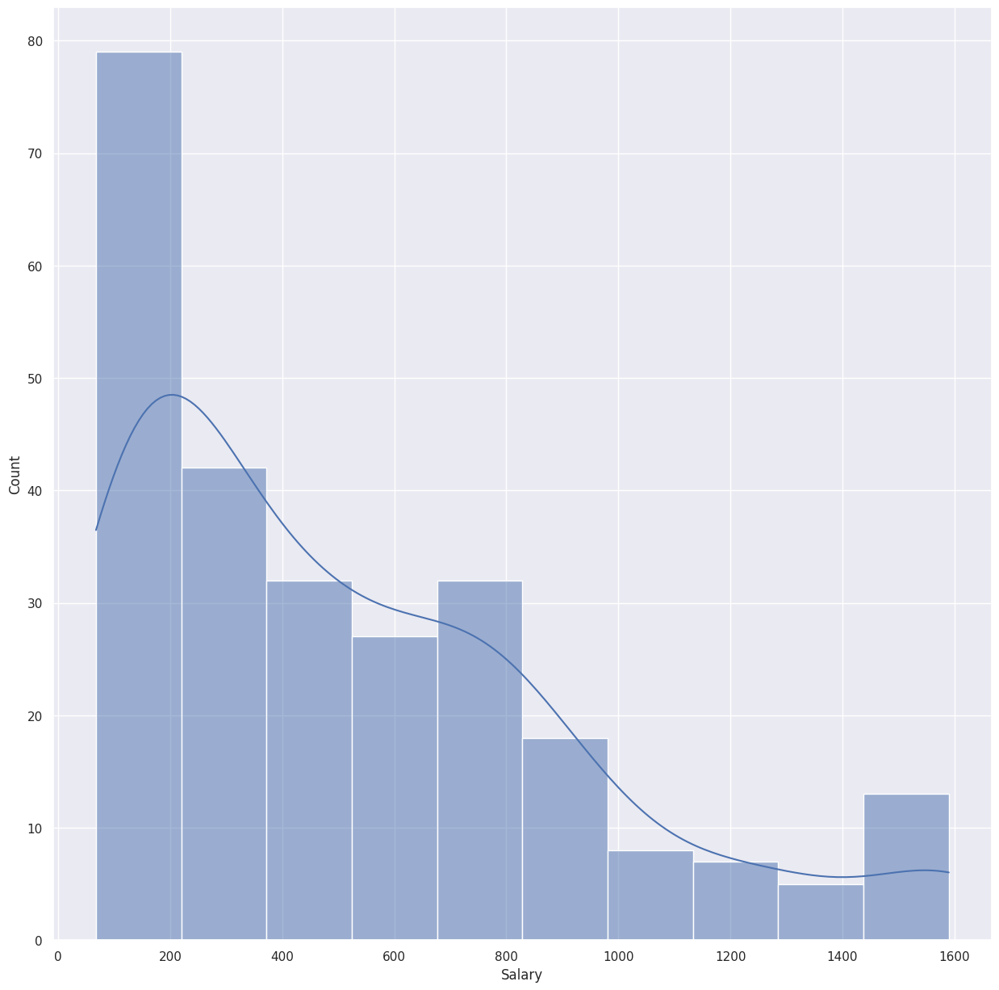

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(df['Salary'], kde=True)
plt.show()


In [32]:
X = df.select_dtypes(include=[np.number]).drop(["Salary"], axis=1)
y = df["Salary"]


In [33]:
y = df["Salary"]
X = df.drop(["Salary"], axis=1)

models = [('LR', LinearRegression()),
          ("Ridge", Ridge()),
          ("Lasso", Lasso()),
          ("ElasticNet", ElasticNet()),
          ('KNN', KNeighborsRegressor()),
          ('CART', DecisionTreeRegressor()),
          ('RF', RandomForestRegressor()),
          ('SVR', SVR()),
          ('GBM', GradientBoostingRegressor()),
          ("XGBoost", XGBRegressor(objective='reg:squarederror')),
          ("LightGBM", LGBMRegressor()),
          ("CatBoost", CatBoostRegressor(verbose=False))]


for name, regressor in models:
    rmse = np.mean(np.sqrt(-cross_val_score(regressor, X, y, cv=10, scoring="neg_mean_squared_error")))
    print(f"RMSE: {round(rmse, 4)} ({name}) ")


RMSE: 236.0151 (LR) 
RMSE: 232.0914 (Ridge) 
RMSE: 230.1802 (Lasso) 
RMSE: 256.2534 (ElasticNet) 
RMSE: 253.4936 (KNN) 
RMSE: 283.9952 (CART) 
RMSE: 208.3267 (RF) 
RMSE: 398.3709 (SVR) 
RMSE: 200.2759 (GBM) 
RMSE: 217.6696 (XGBoost) 
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2430
[LightGBM] [Info] Number of data points in the train set: 236, number of used features: 38
[LightGBM] [Info] Start training from score 525.722458
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

In [1]:
rf_model = RandomForestRegressor(random_state=17)

rf_params = {"max_depth": [5, 8, 15, None],
             "max_features": [5, 7, "auto"],
             "min_samples_split": [8, 15, 20],
             "n_estimators": [200, 500]}

rf_best_grid = GridSearchCV(rf_model, rf_params, cv=5, n_jobs=-1, verbose=True).fit(X, y)
rf_final = rf_model.set_params(**rf_best_grid.best_params_, random_state=17).fit(X, y)
rmse = np.mean(np.sqrt(-cross_val_score(rf_final, X, y, cv=10, scoring="neg_mean_squared_error")))
rmse


NameError: name 'RandomForestRegressor' is not defined

In [2]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
import numpy as np


In [3]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
import numpy as np

rf_model = RandomForestRegressor(random_state=17)

rf_params = {"max_depth": [5, 8, 15, None],
             "max_features": [5, 7, "auto"],
             "min_samples_split": [8, 15, 20],
             "n_estimators": [200, 500]}

rf_best_grid = GridSearchCV(rf_model, rf_params, cv=5, n_jobs=-1, verbose=True).fit(X, y)
rf_final = rf_model.set_params(**rf_best_grid.best_params_, random_state=17).fit(X, y)
rmse = np.mean(np.sqrt(-cross_val_score(rf_final, X, y, cv=10, scoring="neg_mean_squared_error")))
print(rmse)


NameError: name 'X' is not defined

In [4]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
import numpy as np

# Örnek DataFrame (df) üzerinden X ve y'yi tanımlayın
y = df["Salary"]
X = df.drop(["Salary"], axis=1)

rf_model = RandomForestRegressor(random_state=17)

rf_params = {"max_depth": [5, 8, 15, None],
             "max_features": [5, 7, "auto"],
             "min_samples_split": [8, 15, 20],
             "n_estimators": [200, 500]}

rf_best_grid = GridSearchCV(rf_model, rf_params, cv=5, n_jobs=-1, verbose=True).fit(X, y)
rf_final = rf_model.set_params(**rf_best_grid.best_params_, random_state=17).fit(X, y)
rmse = np.mean(np.sqrt(-cross_val_score(rf_final, X, y, cv=10, scoring="neg_mean_squared_error")))
print(rmse)


NameError: name 'df' is not defined

In [7]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
import numpy as np

# Ensure 'df' is defined and contains 'Salary' column
# Example:
df = pd.read_csv("/kaggle/input/hitter/hitters.csv")

y = df["Salary"]
X = df.drop(["Salary"], axis=1)

rf_model = RandomForestRegressor(random_state=17)

rf_params = {
    "max_depth": [5, 8, 15, None],
    "max_features": ["auto", "sqrt", "log2"],
    "min_samples_split": [8, 15, 20],
    "n_estimators": [200, 500]
}

# Perform GridSearchCV
rf_best_grid = GridSearchCV(rf_model, rf_params, cv=5, n_jobs=-1, verbose=True)
rf_best_grid.fit(X, y)

# Initialize the final model with the best parameters
rf_final = RandomForestRegressor(
    **rf_best_grid.best_params_,
    random_state=17
)
rf_final.fit(X, y)

# Compute RMSE
rmse = np.mean(np.sqrt(-cross_val_score(rf_final, X, y, cv=10, scoring="neg_mean_squared_error")))
print(f"RMSE: {rmse}")


Fitting 5 folds for each of 72 candidates, totalling 360 fits


ValueError: 
All the 360 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
360 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_forest.py", line 345, in fit
    X, y = self._validate_data(
  File "/opt/conda/lib/python3.10/site-packages/sklearn/base.py", line 584, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py", line 1106, in check_X_y
    X = check_array(
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py", line 879, in check_array
    array = _asarray_with_order(array, order=order, dtype=dtype, xp=xp)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/_array_api.py", line 185, in _asarray_with_order
    array = numpy.asarray(array, order=order, dtype=dtype)
  File "/opt/conda/lib/python3.10/site-packages/pandas/core/generic.py", line 2153, in __array__
    arr = np.asarray(values, dtype=dtype)
ValueError: could not convert string to float: 'A'


In [8]:
print(df.dtypes)


AtBat          int64
Hits           int64
HmRun          int64
Runs           int64
RBI            int64
Walks          int64
Years          int64
CAtBat         int64
CHits          int64
CHmRun         int64
CRuns          int64
CRBI           int64
CWalks         int64
League        object
Division      object
PutOuts        int64
Assists        int64
Errors         int64
Salary       float64
NewLeague     object
dtype: object


In [9]:
X = pd.get_dummies(X, drop_first=True)


In [10]:
print(X.isnull().sum())


AtBat          0
Hits           0
HmRun          0
Runs           0
RBI            0
Walks          0
Years          0
CAtBat         0
CHits          0
CHmRun         0
CRuns          0
CRBI           0
CWalks         0
PutOuts        0
Assists        0
Errors         0
League_N       0
Division_W     0
NewLeague_N    0
dtype: int64


In [11]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
import numpy as np

# Load the DataFrame
df = pd.read_csv("/kaggle/input/hitter/hitters.csv")

# Define X and y
y = df["Salary"]
X = df.drop(["Salary"], axis=1)

# Handle categorical data and missing values
X = pd.get_dummies(X, drop_first=True)
X = X.fillna(X.mean())  # Or use other methods to handle missing values

# Define and fit the model
rf_model = RandomForestRegressor(random_state=17)

rf_params = {
    "max_depth": [5, 8, 15, None],
    "max_features": ["auto", "sqrt", "log2"],
    "min_samples_split": [8, 15, 20],
    "n_estimators": [200, 500]
}

# Perform GridSearchCV
rf_best_grid = GridSearchCV(rf_model, rf_params, cv=5, n_jobs=-1, verbose=True)
rf_best_grid.fit(X, y)

# Initialize the final model with the best parameters
rf_final = RandomForestRegressor(
    **rf_best_grid.best_params_,
    random_state=17
)
rf_final.fit(X, y)

# Compute RMSE
rmse = np.mean(np.sqrt(-cross_val_score(rf_final, X, y, cv=10, scoring="neg_mean_squared_error")))
print(f"RMSE: {rmse}")


Fitting 5 folds for each of 72 candidates, totalling 360 fits


ValueError: 
All the 360 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
360 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_forest.py", line 345, in fit
    X, y = self._validate_data(
  File "/opt/conda/lib/python3.10/site-packages/sklearn/base.py", line 584, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py", line 1122, in check_X_y
    y = _check_y(y, multi_output=multi_output, y_numeric=y_numeric, estimator=estimator)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py", line 1132, in _check_y
    y = check_array(
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py", line 921, in check_array
    _assert_all_finite(
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py", line 161, in _assert_all_finite
    raise ValueError(msg_err)
ValueError: Input y contains NaN.


In [12]:
gbm_model = GradientBoostingRegressor(random_state=17)

gbm_params = {"learning_rate": [0.01, 0.1],
              "max_depth": [3, 8],
              "n_estimators": [500, 1000],
              "subsample": [1, 0.5, 0.7]}

gbm_best_grid = GridSearchCV(gbm_model, gbm_params, cv=5, n_jobs=-1, verbose=True).fit(X, y)
gbm_final = gbm_model.set_params(**gbm_best_grid.best_params_, random_state=17, ).fit(X, y)
rmse = np.mean(np.sqrt(-cross_val_score(gbm_final, X, y, cv=10, scoring="neg_mean_squared_error")))
rmse


NameError: name 'GradientBoostingRegressor' is not defined

In [13]:
import pandas as pd
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
import numpy as np

# Load the DataFrame
df = pd.read_csv("/kaggle/input/hitter/hitters.csv")

# Define X and y
y = df["Salary"]
X = df.drop(["Salary"], axis=1)

# Handle categorical data and missing values
X = pd.get_dummies(X, drop_first=True)
X = X.fillna(X.mean())  # Or use other methods to handle missing values

# Define and fit the Gradient Boosting model
gbm_model = GradientBoostingRegressor(random_state=17)

gbm_params = {
    "learning_rate": [0.01, 0.1],
    "max_depth": [3, 8],
    "n_estimators": [500, 1000],
    "subsample": [1, 0.5, 0.7]
}

# Perform GridSearchCV
gbm_best_grid = GridSearchCV(gbm_model, gbm_params, cv=5, n_jobs=-1, verbose=True)
gbm_best_grid.fit(X, y)

# Initialize the final model with the best parameters
gbm_final = GradientBoostingRegressor(
    **gbm_best_grid.best_params_,
    random_state=17
)
gbm_final.fit(X, y)

# Compute RMSE
rmse = np.mean(np.sqrt(-cross_val_score(gbm_final, X, y, cv=10, scoring="neg_mean_squared_error")))
print(f"RMSE: {rmse}")


Fitting 5 folds for each of 24 candidates, totalling 120 fits


ValueError: 
All the 120 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
120 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_gb.py", line 429, in fit
    X, y = self._validate_data(
  File "/opt/conda/lib/python3.10/site-packages/sklearn/base.py", line 584, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py", line 1122, in check_X_y
    y = _check_y(y, multi_output=multi_output, y_numeric=y_numeric, estimator=estimator)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py", line 1132, in _check_y
    y = check_array(
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py", line 921, in check_array
    _assert_all_finite(
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py", line 161, in _assert_all_finite
    raise ValueError(msg_err)
ValueError: Input y contains NaN.


In [14]:
import pandas as pd
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
import numpy as np

# Load the DataFrame
df = pd.read_csv("/kaggle/input/hitter/hitters.csv")

# Define X and y
y = df["Salary"]
X = df.drop(["Salary"], axis=1)

# Handle categorical data and missing values
X = pd.get_dummies(X, drop_first=True)
X = X.fillna(X.mean())  # Or use other methods to handle missing values

# Check for missing values in y
if y.isnull().any():
    print("Target variable 'y' contains missing values. Handling missing values...")
    y = y.fillna(y.median())  # Impute missing values with the median of y

# Define and fit the Gradient Boosting model
gbm_model = GradientBoostingRegressor(random_state=17)

gbm_params = {
    "learning_rate": [0.01, 0.1],
    "max_depth": [3, 8],
    "n_estimators": [500, 1000],
    "subsample": [1, 0.5, 0.7]
}

# Perform GridSearchCV
gbm_best_grid = GridSearchCV(gbm_model, gbm_params, cv=5, n_jobs=-1, verbose=True)
gbm_best_grid.fit(X, y)

# Initialize the final model with the best parameters
gbm_final = GradientBoostingRegressor(
    **gbm_best_grid.best_params_,
    random_state=17
)
gbm_final.fit(X, y)

# Compute RMSE
rmse = np.mean(np.sqrt(-cross_val_score(gbm_final, X, y, cv=10, scoring="neg_mean_squared_error")))
print(f"RMSE: {rmse}")


Target variable 'y' contains missing values. Handling missing values...
Fitting 5 folds for each of 24 candidates, totalling 120 fits
RMSE: 282.74898320294045


In [16]:
lgbm_model = LGBMRegressor(random_state=17)

lgbm_params = {"learning_rate": [0.01, 0.1],
                "n_estimators": [300, 500],
                "colsample_bytree": [0.7, 1]}

lgbm_best_grid = GridSearchCV(lgbm_model, lgbm_params, cv=5, n_jobs=-1, verbose=True).fit(X, y)
lgbm_final = lgbm_model.set_params(**lgbm_best_grid.best_params_, random_state=17).fit(X, y)
rmse = np.mean(np.sqrt(-cross_val_score(lgbm_final, X, y, cv=10, scoring="neg_mean_squared_error")))
rmse

NameError: name 'LGBMRegressor' is not defined

In [17]:
import pandas as pd
from lightgbm import LGBMRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
import numpy as np

# Load the DataFrame
df = pd.read_csv("/kaggle/input/hitter/hitters.csv")

# Define X and y
y = df["Salary"]
X = df.drop(["Salary"], axis=1)

# Handle categorical data and missing values
X = pd.get_dummies(X, drop_first=True)
X = X.fillna(X.mean())  # Or use other methods to handle missing values

# Check for missing values in y
if y.isnull().any():
    print("Target variable 'y' contains missing values. Handling missing values...")
    y = y.fillna(y.median())  # Impute missing values with the median of y

# Define and fit the LightGBM model
lgbm_model = LGBMRegressor(random_state=17)

lgbm_params = {
    "learning_rate": [0.01, 0.1],
    "n_estimators": [300, 500],
    "colsample_bytree": [0.7, 1]
}

# Perform GridSearchCV
lgbm_best_grid = GridSearchCV(lgbm_model, lgbm_params, cv=5, n_jobs=-1, verbose=True)
lgbm_best_grid.fit(X, y)

# Initialize the final model with the best parameters
lgbm_final = LGBMRegressor(
    **lgbm_best_grid.best_params_,
    random_state=17
)
lgbm_final.fit(X, y)

# Compute RMSE
rmse = np.mean(np.sqrt(-cross_val_score(lgbm_final, X, y, cv=10, scoring="neg_mean_squared_error")))
print(f"RMSE: {rmse}")


Target variable 'y' contains missing values. Handling missing values...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1012
[LightGBM] [Info] Number of data points in the train set: 257, number of used features: 19
[LightGBM] [Info] Start training from score 488.732074
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

In [18]:
catboost_model = CatBoostRegressor(random_state=17, verbose=False)

catboost_params = {"iterations": [200, 500],
                   "learning_rate": [0.01, 0.1],
                   "depth": [3, 6]}

catboost_best_grid = GridSearchCV(catboost_model, catboost_params, cv=5, n_jobs=-1, verbose=True).fit(X, y)
catboost_final = catboost_model.set_params(**catboost_best_grid.best_params_, random_state=17).fit(X, y)
rmse = np.mean(np.sqrt(-cross_val_score(catboost_final, X, y, cv=10, scoring="neg_mean_squared_error")))
rmse


NameError: name 'CatBoostRegressor' is not defined

In [19]:
import pandas as pd
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
import numpy as np

# Load the DataFrame
df = pd.read_csv("/kaggle/input/hitter/hitters.csv")

# Define X and y
y = df["Salary"]
X = df.drop(["Salary"], axis=1)

# Handle categorical data and missing values
X = pd.get_dummies(X, drop_first=True)
X = X.fillna(X.mean())  # Or use other methods to handle missing values

# Check for missing values in y
if y.isnull().any():
    print("Target variable 'y' contains missing values. Handling missing values...")
    y = y.fillna(y.median())  # Impute missing values with the median of y

# Define and fit the CatBoost model
catboost_model = CatBoostRegressor(random_state=17, verbose=False)

catboost_params = {
    "iterations": [200, 500],
    "learning_rate": [0.01, 0.1],
    "depth": [3, 6]
}

# Perform GridSearchCV
catboost_best_grid = GridSearchCV(catboost_model, catboost_params, cv=5, n_jobs=-1, verbose=True)
catboost_best_grid.fit(X, y)

# Initialize the final model with the best parameters
catboost_final = CatBoostRegressor(
    **catboost_best_grid.best_params_,
    random_state=17,
    verbose=False
)
catboost_final.fit(X, y)

# Compute RMSE
rmse = np.mean(np.sqrt(-cross_val_score(catboost_final, X, y, cv=10, scoring="neg_mean_squared_error")))
print(f"RMSE: {rmse}")


Target variable 'y' contains missing values. Handling missing values...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
RMSE: 285.54620279439905


In [ ]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
import numpy as np

# Define parameter grids
rf_params = {"max_depth": [5, 8, 15, None],
             "max_features": [5, 7, 1.0],  # Updated to use 1.0 or remove it
             "min_samples_split": [8, 15, 20],
             "n_estimators": [200, 500]}

gbm_params = {"learning_rate": [0.01, 0.1],
              "max_depth": [3, 8],
              "n_estimators": [500, 1000],
              "subsample": [1, 0.5, 0.7]}

lightgbm_params = {"learning_rate": [0.01, 0.1],
                   "n_estimators": [300, 500],
                   "colsample_bytree": [0.7, 1]}

catboost_params = {"iterations": [200, 500],
                   "learning_rate": [0.01, 0.1],
                   "depth": [3, 6]}

# Define regressors and their parameters
regressors = [("RF", RandomForestRegressor(), rf_params),
              ('GBM', GradientBoostingRegressor(), gbm_params),
              ('LightGBM', LGBMRegressor(), lightgbm_params),
              ("CatBoost", CatBoostRegressor(), catboost_params)]

best_models = {}

# Grid search and evaluation
for name, regressor, params in regressors:
    print(f"########## {name} ##########")
    
    # Initial RMSE evaluation
    rmse = np.mean(np.sqrt(-cross_val_score(regressor, X, y, cv=10, scoring="neg_mean_squared_error")))
    print(f"RMSE: {round(rmse, 4)} ({name}) ")
    
    # GridSearchCV
    gs_best = GridSearchCV(regressor, params, cv=3, n_jobs=-1, verbose=False)
    gs_best.fit(X, y)
    
    # Final model with best parameters
    final_model = regressor.set_params(**gs_best.best_params_)
    final_model.fit(X, y)
    
    # RMSE after parameter tuning
    rmse = np.mean(np.sqrt(-cross_val_score(final_model, X, y, cv=10, scoring="neg_mean_squared_error")))
    print(f"RMSE (After): {round(rmse, 4)} ({name}) ")
    
    print(f"{name} best params: {gs_best.best_params_}", end="\n\n")
    
    best_models[name] = final_model


In [20]:
rf_params = {"max_depth": [5, 8, 15, None],
             "max_features": [5, 7, "auto"],
             "min_samples_split": [8, 15, 20],
             "n_estimators": [200, 500]}

gbm_params = {"learning_rate": [0.01, 0.1],
              "max_depth": [3, 8],
              "n_estimators": [500, 1000],
              "subsample": [1, 0.5, 0.7]}


lightgbm_params = {"learning_rate": [0.01, 0.1],
                   "n_estimators": [300, 500],
                   "colsample_bytree": [0.7, 1]}

catboost_params = {"iterations": [200, 500],
                   "learning_rate": [0.01, 0.1],
                   "depth": [3, 6]}


regressors = [("RF", RandomForestRegressor(), rf_params),
              ('GBM', GradientBoostingRegressor(), gbm_params),
              ('LightGBM', LGBMRegressor(), lightgbm_params),
              ("CatBoost", CatBoostRegressor(), catboost_params)]


best_models = {}

for name, regressor, params in regressors:
    print(f"########## {name} ##########")
    rmse = np.mean(np.sqrt(-cross_val_score(regressor, X, y, cv=10, scoring="neg_mean_squared_error")))
    print(f"RMSE: {round(rmse, 4)} ({name}) ")

    gs_best = GridSearchCV(regressor, params, cv=3, n_jobs=-1, verbose=False).fit(X, y)

    final_model = regressor.set_params(**gs_best.best_params_)
    rmse = np.mean(np.sqrt(-cross_val_score(final_model, X, y, cv=10, scoring="neg_mean_squared_error")))
    print(f"RMSE (After): {round(rmse, 4)} ({name}) ")

    print(f"{name} best params: {gs_best.best_params_}", end="\n\n")

    best_models[name] = final_model

########## RF ##########
RMSE: 285.4456 (RF) 


/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors

RMSE (After): 282.1217 (RF) 
RF best params: {'max_depth': 5, 'max_features': 'auto', 'min_samples_split': 8, 'n_estimators': 500}

########## GBM ##########
RMSE: 291.3097 (GBM) 
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

In [22]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
import numpy as np

# Define parameter grids
rf_params = {"max_depth": [5, 8, 15, None],
             "max_features": [5, 7, 1.0],  # Updated to use 1.0 or remove it
             "min_samples_split": [8, 15, 20],
             "n_estimators": [200, 500]}

gbm_params = {"learning_rate": [0.01, 0.1],
              "max_depth": [3, 8],
              "n_estimators": [500, 1000],
              "subsample": [1, 0.5, 0.7]}

lightgbm_params = {"learning_rate": [0.01, 0.1],
                   "n_estimators": [300, 500],
                   "colsample_bytree": [0.7, 1]}

catboost_params = {"iterations": [200, 500],
                   "learning_rate": [0.01, 0.1],
                   "depth": [3, 6]}

# Define regressors and their parameters
regressors = [("RF", RandomForestRegressor(), rf_params),
              ('GBM', GradientBoostingRegressor(), gbm_params),
              ('LightGBM', LGBMRegressor(), lightgbm_params),
              ("CatBoost", CatBoostRegressor(), catboost_params)]

best_models = {}

# Grid search and evaluation
for name, regressor, params in regressors:
    print(f"########## {name} ##########")
    
    # Initial RMSE evaluation
    rmse = np.mean(np.sqrt(-cross_val_score(regressor, X, y, cv=10, scoring="neg_mean_squared_error")))
    print(f"RMSE: {round(rmse, 4)} ({name}) ")
    
    # GridSearchCV
    gs_best = GridSearchCV(regressor, params, cv=3, n_jobs=-1, verbose=False)
    gs_best.fit(X, y)
    
    # Final model with best parameters
    final_model = regressor.set_params(**gs_best.best_params_)
    final_model.fit(X, y)
    
    # RMSE after parameter tuning
    rmse = np.mean(np.sqrt(-cross_val_score(final_model, X, y, cv=10, scoring="neg_mean_squared_error")))
    print(f"RMSE (After): {round(rmse, 4)} ({name}) ")
    
    print(f"{name} best params: {gs_best.best_params_}", end="\n\n")
    
    best_models[name] = final_model


########## RF ##########
RMSE: 287.6724 (RF) 
RMSE (After): 285.5208 (RF) 
RF best params: {'max_depth': 15, 'max_features': 1.0, 'min_samples_split': 8, 'n_estimators': 200}

########## GBM ##########
RMSE: 291.1867 (GBM) 
RMSE (After): 280.7153 (GBM) 
GBM best params: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500, 'subsample': 0.5}

########## LightGBM ##########
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1131
[LightGBM] [Info] Number of data points in the train set: 289, number of used features: 19
[LightGBM] [Info] Start training from score 521.720983
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

In [23]:

def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value",
                                                                     ascending=False)[0:num])
    plt.title('Features')
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig('importances.png')


plot_importance(rf_final, X)
plot_importance(gbm_final, X)
plot_importance(lgbm_final, X)
plot_importance(catboost_final, X)


NameError: name 'rf_final' is not defined

########## RF ##########
RMSE: 285.6902 (RF) 
RMSE (After): 285.4111 (RF) 
RF best params: {'max_depth': None, 'max_features': 1.0, 'min_samples_split': 8, 'n_estimators': 200}

########## GBM ##########
RMSE: 296.8003 (GBM) 
RMSE (After): 310.9397 (GBM) 
GBM best params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500, 'subsample': 0.5}

########## LightGBM ##########
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1131
[LightGBM] [Info] Number of data points in the train set: 289, number of used features: 19
[LightGBM] [Info] Start training from score 521.720983
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

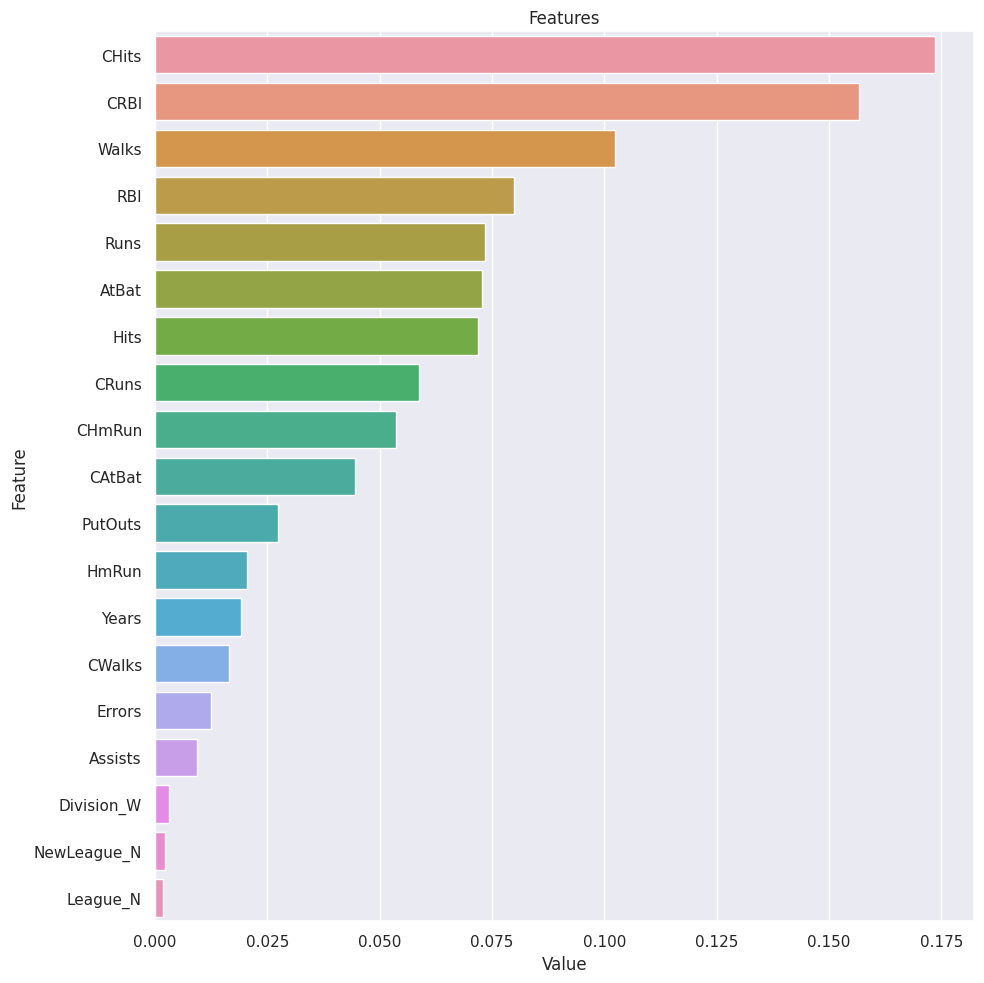

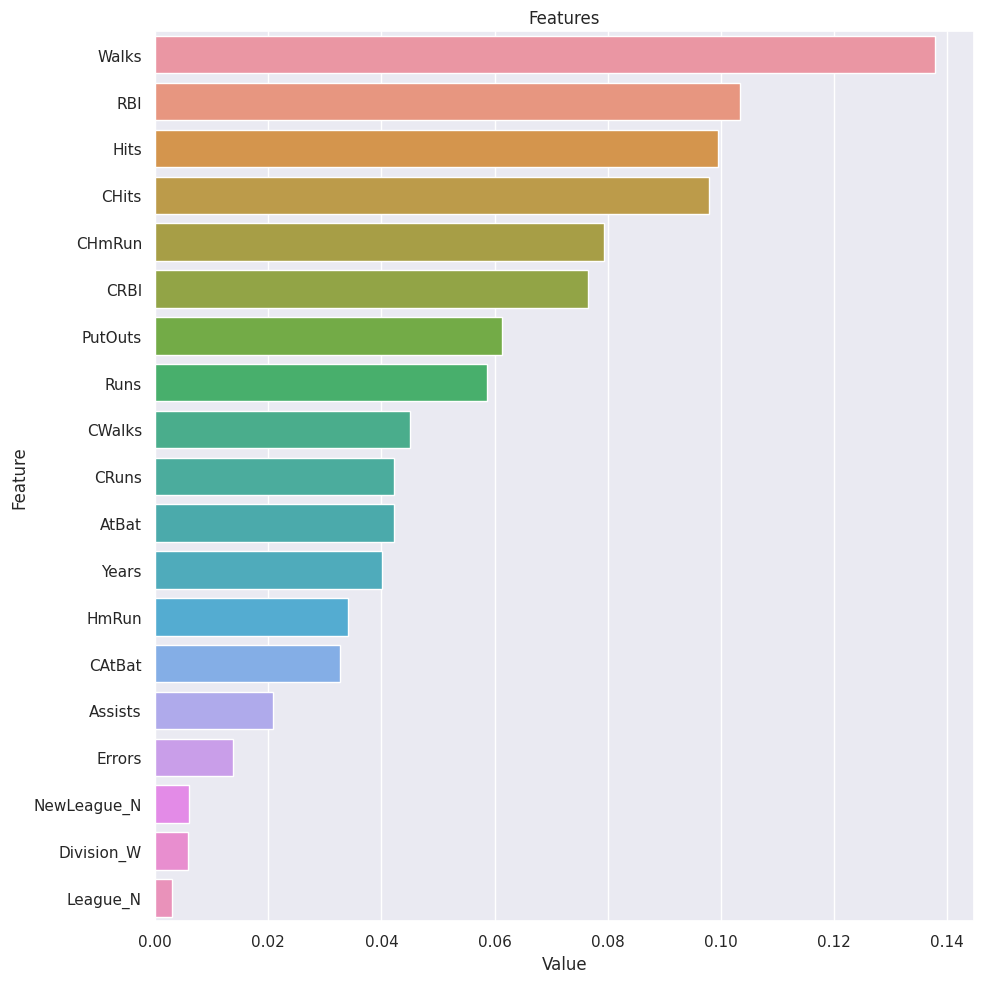

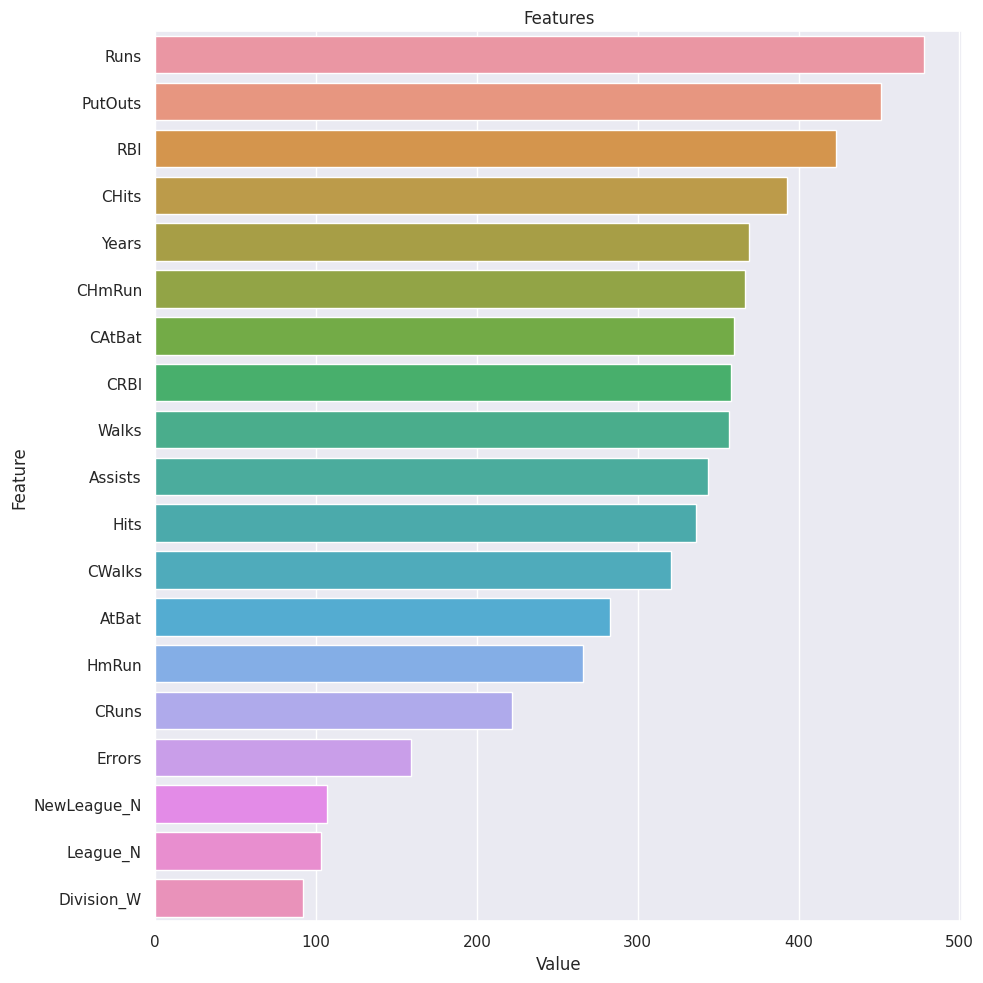

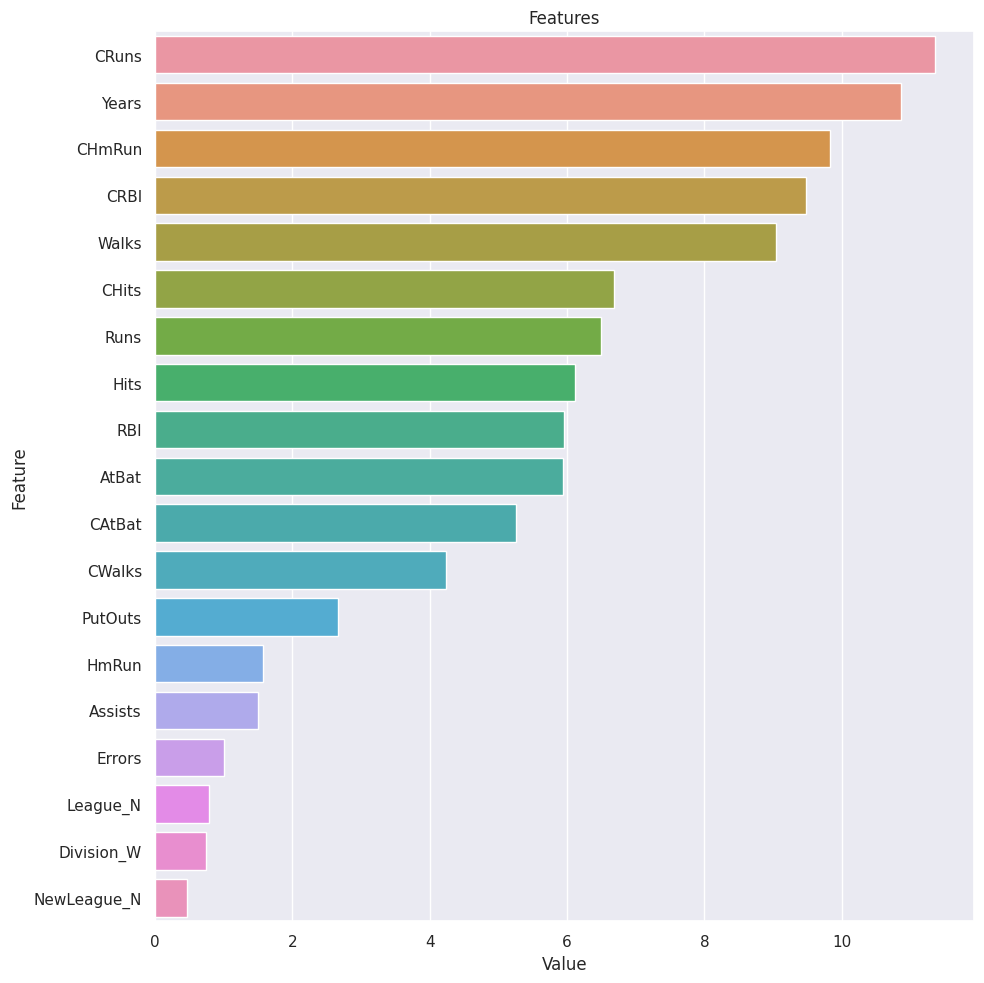

In [24]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define parameter grids
rf_params = {"max_depth": [5, 8, 15, None],
             "max_features": [5, 7, 1.0],  # Updated to use 1.0 or remove it
             "min_samples_split": [8, 15, 20],
             "n_estimators": [200, 500]}

gbm_params = {"learning_rate": [0.01, 0.1],
              "max_depth": [3, 8],
              "n_estimators": [500, 1000],
              "subsample": [1, 0.5, 0.7]}

lightgbm_params = {"learning_rate": [0.01, 0.1],
                   "n_estimators": [300, 500],
                   "colsample_bytree": [0.7, 1]}

catboost_params = {"iterations": [200, 500],
                   "learning_rate": [0.01, 0.1],
                   "depth": [3, 6]}

# Define regressors and their parameters
regressors = [("RF", RandomForestRegressor(), rf_params),
              ('GBM', GradientBoostingRegressor(), gbm_params),
              ('LightGBM', LGBMRegressor(), lightgbm_params),
              ("CatBoost", CatBoostRegressor(), catboost_params)]

best_models = {}

# Grid search and evaluation
for name, regressor, params in regressors:
    print(f"########## {name} ##########")
    
    # Initial RMSE evaluation
    rmse = np.mean(np.sqrt(-cross_val_score(regressor, X, y, cv=10, scoring="neg_mean_squared_error")))
    print(f"RMSE: {round(rmse, 4)} ({name}) ")
    
    # GridSearchCV
    gs_best = GridSearchCV(regressor, params, cv=3, n_jobs=-1, verbose=False)
    gs_best.fit(X, y)
    
    # Final model with best parameters
    final_model = regressor.set_params(**gs_best.best_params_)
    final_model.fit(X, y)
    
    # RMSE after parameter tuning
    rmse = np.mean(np.sqrt(-cross_val_score(final_model, X, y, cv=10, scoring="neg_mean_squared_error")))
    print(f"RMSE (After): {round(rmse, 4)} ({name}) ")
    
    print(f"{name} best params: {gs_best.best_params_}", end="\n\n")
    
    best_models[name] = final_model

# Assign final models to variables
rf_final = best_models["RF"]
gbm_final = best_models["GBM"]
lgbm_final = best_models["LightGBM"]
catboost_final = best_models["CatBoost"]

# Define plot_importance function
def plot_importance(model, features, num=len(X.columns), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value",
                                                                     ascending=False)[0:num])
    plt.title('Features')
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig('importances.png')

# Plot feature importances
plot_importance(rf_final, X)
plot_importance(gbm_final, X)
plot_importance(lgbm_final, X)
plot_importance(catboost_final, X)


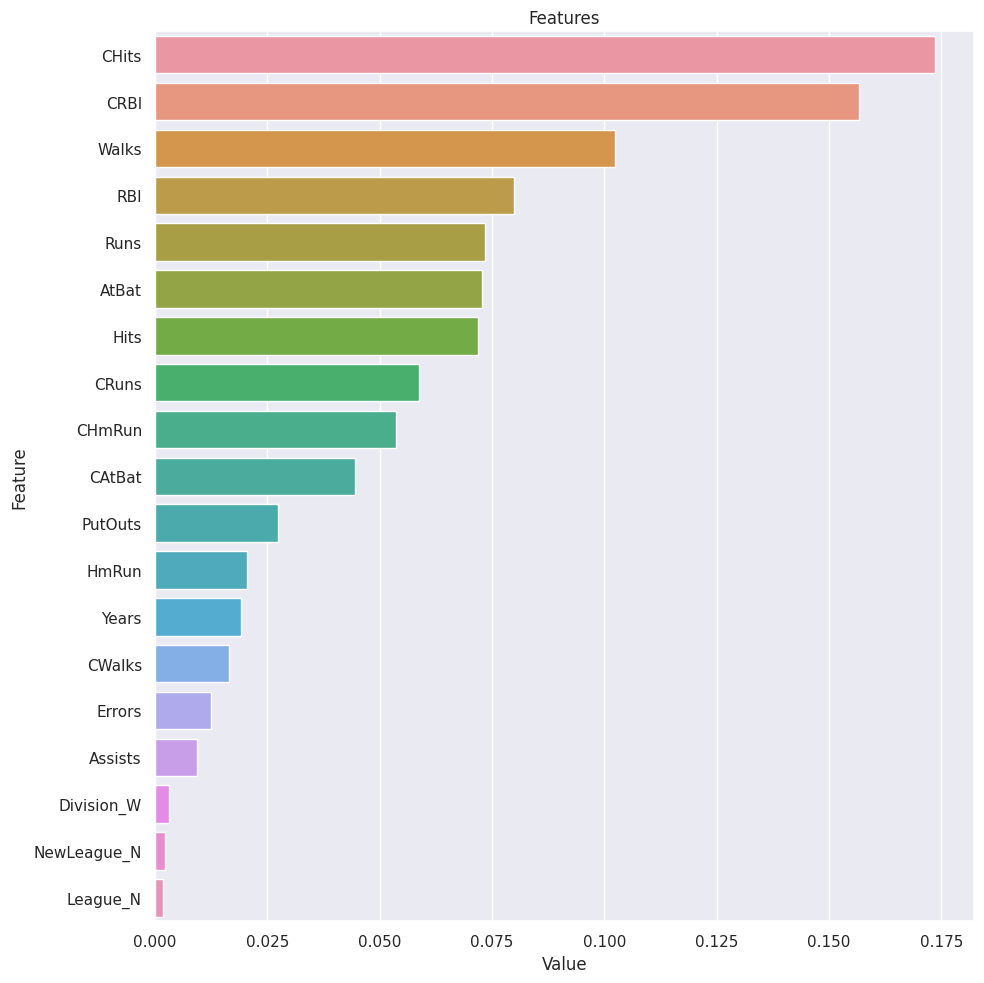

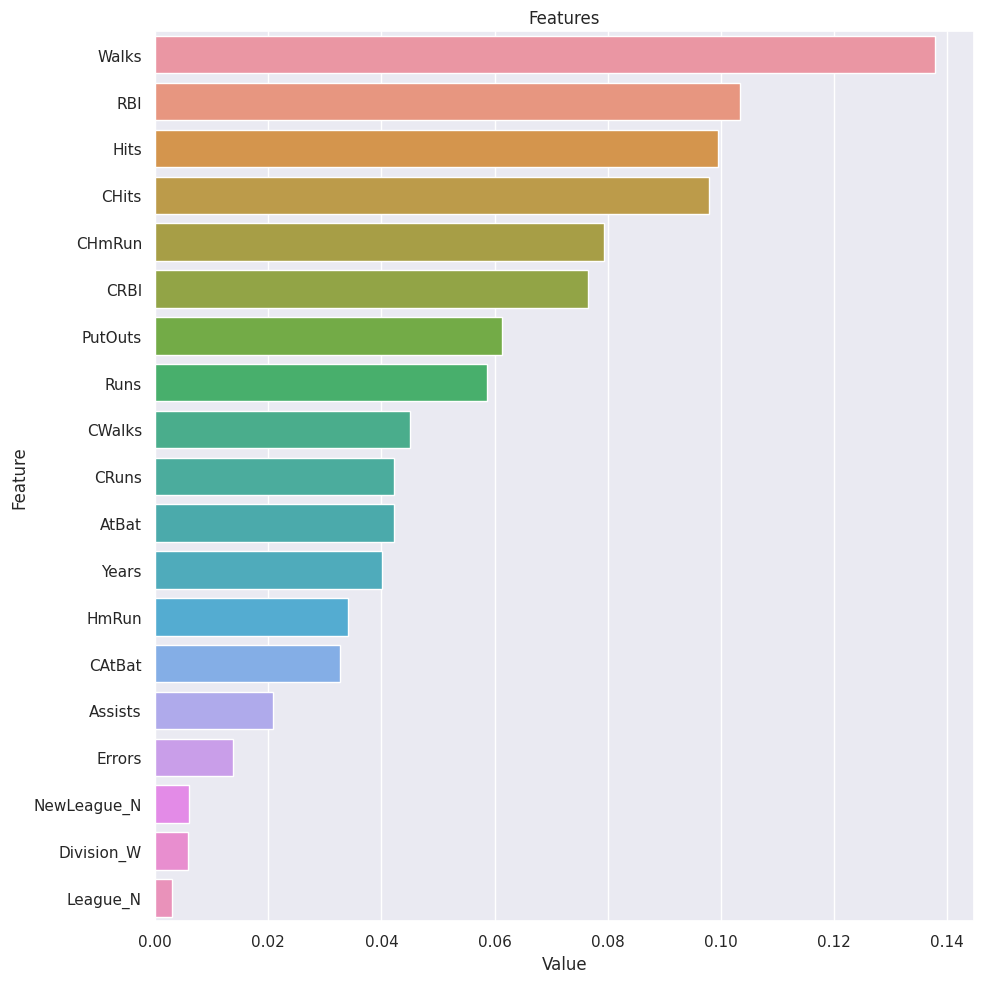

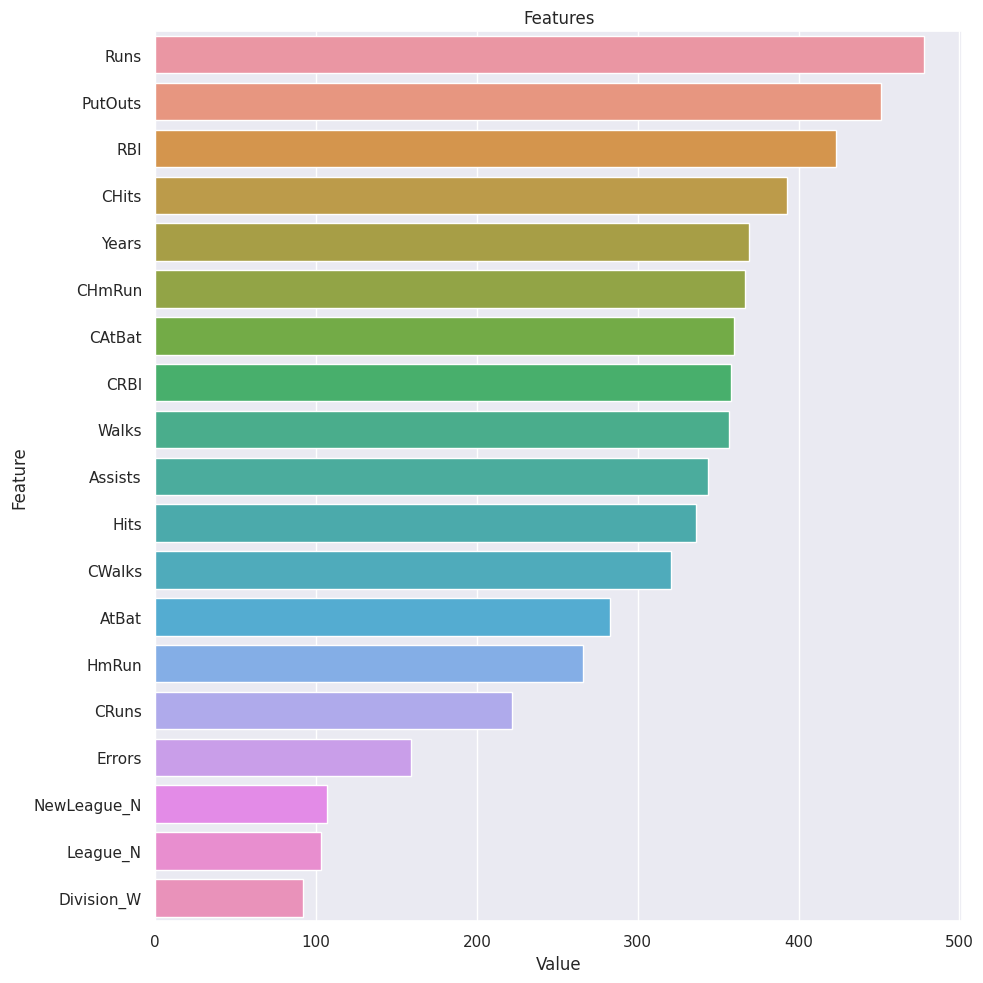

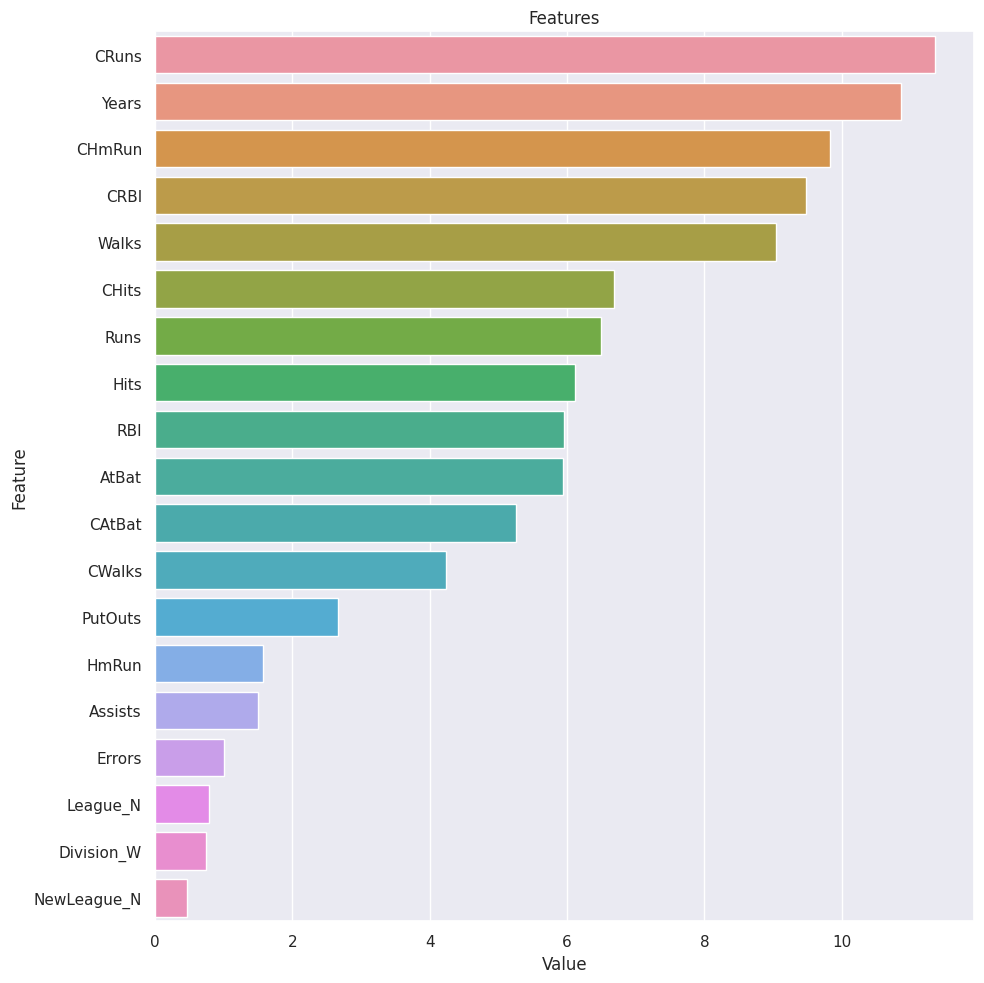

In [25]:
def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value",
                                                                     ascending=False)[0:num])
    plt.title('Features')
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig('importances.png')


plot_importance(rf_final, X)
plot_importance(gbm_final, X)
plot_importance(lgbm_final, X)
plot_importance(catboost_final, X)

In [26]:
def val_curve_params(model, X, y, param_name, param_range, scoring="roc_auc", cv=10):
    train_score, test_score = validation_curve(
        model, X=X, y=y, param_name=param_name, param_range=param_range, scoring=scoring, cv=cv)

    mean_train_score = np.mean(train_score, axis=1)
    mean_test_score = np.mean(test_score, axis=1)

    plt.plot(param_range, mean_train_score,
             label="Training Score", color='b')

    plt.plot(param_range, mean_test_score,
             label="Validation Score", color='g')

    plt.title(f"Validation Curve for {type(model).__name__}")
    plt.xlabel(f"Number of {param_name}")
    plt.ylabel(f"{scoring}")
    plt.tight_layout()
    plt.legend(loc='best')
    plt.show()


rf_val_params = [["max_depth", [5, 8, 15, 20, 30, None]],
                 ["max_features", [3, 5, 7, "auto"]],
                 ["min_samples_split", [2, 5, 8, 15, 20]],
                 ["n_estimators", [10, 50, 100, 200, 500]]]


rf_model = RandomForestRegressor(random_state=17)

for i in range(len(rf_val_params)):
    val_curve_params(rf_model, X, y, rf_val_params[i][0], rf_val_params[i][1],scoring="neg_mean_absolute_error")

rf_val_params[0][1]

NameError: name 'validation_curve' is not defined

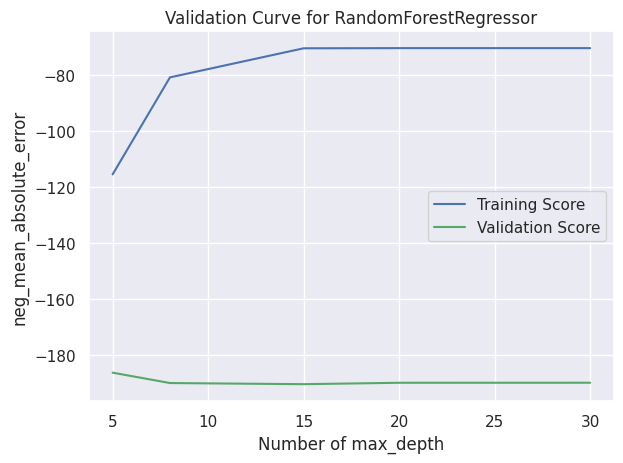

/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors

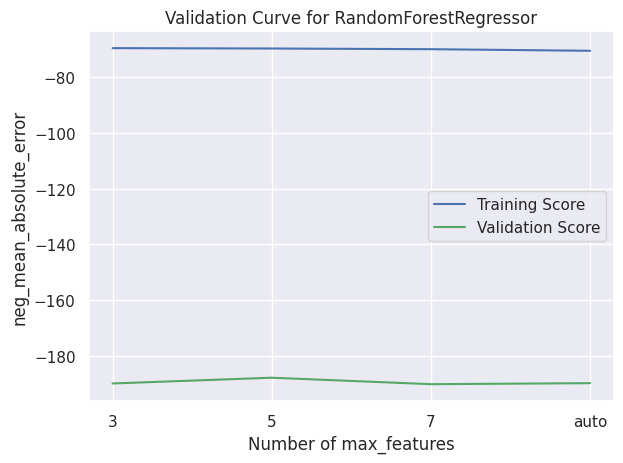

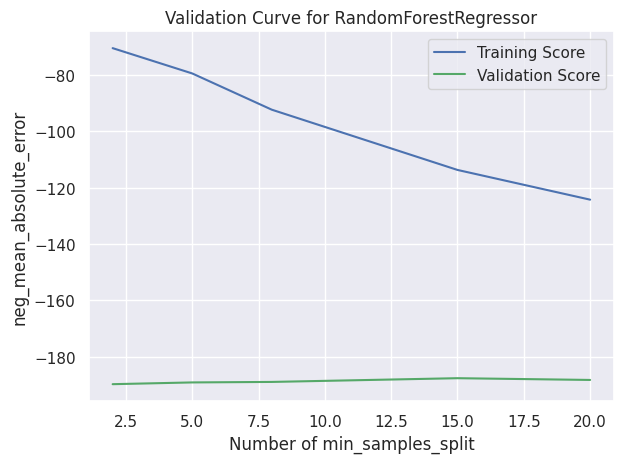

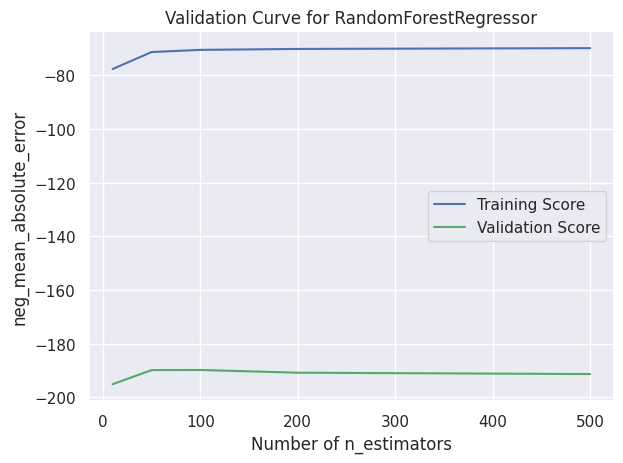

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import validation_curve
from sklearn.ensemble import RandomForestRegressor

# Validasyon eğrisi fonksiyonu
def val_curve_params(model, X, y, param_name, param_range, scoring="roc_auc", cv=10):
    train_score, test_score = validation_curve(
        model, X=X, y=y, param_name=param_name, param_range=param_range, scoring=scoring, cv=cv)

    mean_train_score = np.mean(train_score, axis=1)
    mean_test_score = np.mean(test_score, axis=1)

    plt.plot(param_range, mean_train_score,
             label="Training Score", color='b')

    plt.plot(param_range, mean_test_score,
             label="Validation Score", color='g')

    plt.title(f"Validation Curve for {type(model).__name__}")
    plt.xlabel(f"Number of {param_name}")
    plt.ylabel(f"{scoring}")
    plt.tight_layout()
    plt.legend(loc='best')
    plt.show()

# Parametreler
rf_val_params = [["max_depth", [5, 8, 15, 20, 30, None]],
                 ["max_features", [3, 5, 7, "auto"]],
                 ["min_samples_split", [2, 5, 8, 15, 20]],
                 ["n_estimators", [10, 50, 100, 200, 500]]]

# RandomForest modelini tanımla
rf_model = RandomForestRegressor(random_state=17)

# Verilerinizi tanımlayın
# X, y = ...

# Tüm parametreler için validation curve çizdir
for i in range(len(rf_val_params)):
    val_curve_params(rf_model, X, y, rf_val_params[i][0], rf_val_params[i][1], scoring="neg_mean_absolute_error")


In [28]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Veri setini yükle
data = pd.read_csv("/kaggle/input/hitter/hitters.csv")

# Eksik verileri doldur
data.fillna(data.mean(), inplace=True)

# Bağımsız değişkeni (CRuns) ve bağımlı değişkeni (Salary) tanımla
X = data[["CRuns"]]  # 'CRuns' sütunu bağımsız değişken olarak seçildi
y = data["Salary"]   # 'Salary' sütunu hedef değişken olarak seçildi

# Veriyi eğitim ve test olarak ayır (80% eğitim, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)


TypeError: Could not convert ['ANANNANANAANNANANAANNAANAANNNAANNAANANANANNAAANAANANAAANNANAANANAANAAANNAAAANNAAANAANANAAAANAANNANNNAAAAAANAAAANNNNAAANANNANNAAANANNAANNAAAAAANNANAAAAAANNNANNAAANAANNNAANAANANNNAANANNNNNAANNNAANAAANAAANANANNANAANANNAANNANNNNANAANNNANAAANAANAAANAAAAAAAANNAAAANANNNNNNAANANAAANANANNAANAAAAANNNNANANNAAANNNANNNNNNNNNANANNAAAA'
 'EWWEEWEWWEEWEEEWWWWWEWWWEEEWWWWWWEWWEWEWEWWEEEWEEWWEEWEWWEWEEEWWWEEWEEWEWEEEWEWWWEEWWWWEWWWEEWWWEWWWEEEEEEWWEEWWEWEWWWWEEWWEWWWWEWEEWWWEEEEWWEEWWEEEEEWWWWEWEEWWWEWEWEEEWEWEWWWWWEEEWWWEEWWWWEEEEWEEWEEWEWEEWEWEEEWEWEWEWEWWEEEWEWWWWEWWWWEWWEEEWWEEEEEEEWWWEWWEEEWEWEEEEEWWWWWEWWEWEWWEWWWEEEWEWEWWWEWWEWEWEEWWWEWEEEEEEEWWEEEWEW'
 'ANANNAAANAANNANANAANNNANAANNNAANNAANANANANNAAANAANANAAANNANAANANAANAAANNAAANANAAANAANANAAAANAANNANNNAAAAAANAAAAANNNAAANANNAANAAANANNAANNAANNAANNANAAAAAANNNANNAAANNAANNAANNANANNNANNANNNNNAANNNAANANANAAANANANNNNAAAANNAANNANNNNANAANNNANAAANAANAAAAAAAAAAAAANAAAANANNNNNNAANANAAANANANNAANAAAAANNNAANAANAAANNNANNNNNNNNNANANNAAAA'] to numeric

In [29]:
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt

# Veri setini yükle
data = pd.read_csv("/kaggle/input/hitter/hitters.csv")

# Eksik verileri doldur
data.fillna(data.mean(), inplace=True)

# Bağımsız değişkenleri tanımla
X = data.drop(columns=["Salary"])

# Bağımlı değişkeni (Salary) tanımla
y = data["Salary"]

# Random Forest modelini eğit
from sklearn.ensemble import RandomForestRegressor
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X, y)

# Özellik önemlerini hesapla ve en önemlisine karar ver
def plot_importance(model, features, num=len(X.columns), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title('Features')
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig('importances.png')

    return feature_imp.sort_values(by="Value", ascending=False).iloc[0]['Feature']

# En önemli özelliği bul
important_feature = plot_importance(rf_model, X)

print(f"En önemli özellik: {important_feature}")

# Bu en önemli özelliği y olarak belirleyin
y_new = data[important_feature]


TypeError: Could not convert ['ANANNANANAANNANANAANNAANAANNNAANNAANANANANNAAANAANANAAANNANAANANAANAAANNAAAANNAAANAANANAAAANAANNANNNAAAAAANAAAANNNNAAANANNANNAAANANNAANNAAAAAANNANAAAAAANNNANNAAANAANNNAANAANANNNAANANNNNNAANNNAANAAANAAANANANNANAANANNAANNANNNNANAANNNANAAANAANAAANAAAAAAAANNAAAANANNNNNNAANANAAANANANNAANAAAAANNNNANANNAAANNNANNNNNNNNNANANNAAAA'
 'EWWEEWEWWEEWEEEWWWWWEWWWEEEWWWWWWEWWEWEWEWWEEEWEEWWEEWEWWEWEEEWWWEEWEEWEWEEEWEWWWEEWWWWEWWWEEWWWEWWWEEEEEEWWEEWWEWEWWWWEEWWEWWWWEWEEWWWEEEEWWEEWWEEEEEWWWWEWEEWWWEWEWEEEWEWEWWWWWEEEWWWEEWWWWEEEEWEEWEEWEWEEWEWEEEWEWEWEWEWWEEEWEWWWWEWWWWEWWEEEWWEEEEEEEWWWEWWEEEWEWEEEEEWWWWWEWWEWEWWEWWWEEEWEWEWWWEWWEWEWEEWWWEWEEEEEEEWWEEEWEW'
 'ANANNAAANAANNANANAANNNANAANNNAANNAANANANANNAAANAANANAAANNANAANANAANAAANNAAANANAAANAANANAAAANAANNANNNAAAAAANAAAAANNNAAANANNAANAAANANNAANNAANNAANNANAAAAAANNNANNAAANNAANNAANNANANNNANNANNNNNAANNNAANANANAAANANANNNNAAAANNAANNANNNNANAANNNANAAANAANAAAAAAAAAAAAANAAAANANNNNNNAANANAAANANANNAANAAAAANNNAANAANAAANNNANNNNNNNNNANANNAAAA'] to numeric

In [32]:
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt

# Veri setini yükle
data = pd.read_csv("/kaggle/input/hitter/hitters.csv")

# Sadece sayısal sütunları seç
numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns

# Eksik verileri sadece sayısal sütunlarda doldur
data[numeric_columns] = data[numeric_columns].fillna(data[numeric_columns].mean())

# Bağımsız değişkenleri tanımla
X = data.drop(columns=["Salary"])

# Bağımlı değişkeni (Salary) tanımla
y = data["Salary"]

# Random Forest modelini eğit
from sklearn.ensemble import RandomForestRegressor
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X, y)

# Özellik önemlerini hesapla ve en önemlisine karar ver
def plot_importance(model, features, num=len(X.columns), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title('Features')
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig('importances.png')

    return feature_imp.sort_values(by="Value", ascending=False).iloc[0]['Feature']

# En önemli özelliği bul
important_feature = plot_importance(rf_model, X)

print(f"En önemli özellik: {important_feature}")

# Bu en önemli özelliği y olarak belirleyin
y_new = data[important_feature]


ValueError: could not convert string to float: 'A'

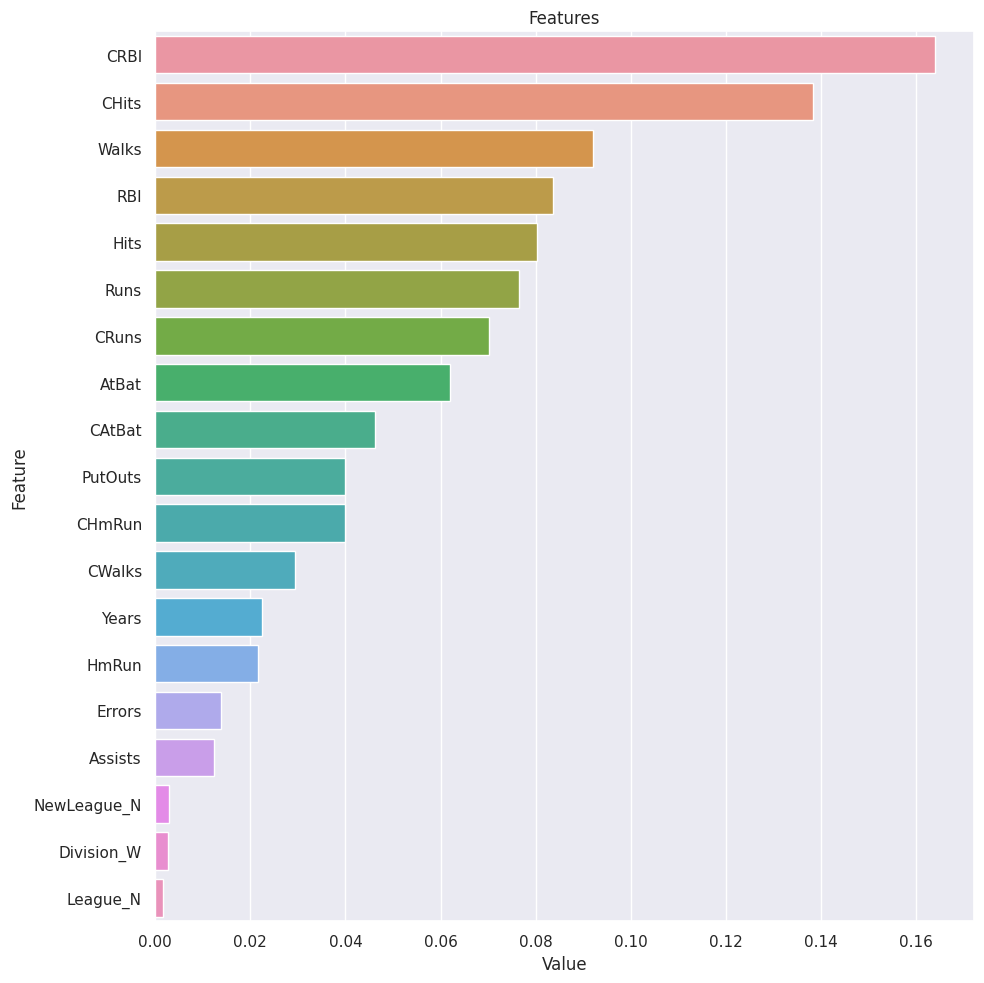

En önemli özellik: CRBI


In [40]:
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor

# Veri setini yükle
data = pd.read_csv("/kaggle/input/hitter/hitters.csv")

# Sadece sayısal sütunları seç
numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns

# Eksik verileri sadece sayısal sütunlarda doldur
data[numeric_columns] = data[numeric_columns].fillna(data[numeric_columns].mean())

# Kategorik değişkenleri One-Hot Encoding ile dönüştür
data = pd.get_dummies(data, drop_first=True)

# Bağımsız değişkenleri tanımla (Salary dışındaki tüm sütunlar)
X = data.drop(columns=["Salary"])

# Bağımlı değişkeni (Salary) tanımla
y = data["Salary"]

# Random Forest modelini eğit
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X, y)

# Özellik önemlerini hesapla ve en önemlisine karar ver
def plot_importance(model, features, num=len(X.columns), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title('Features')
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig('importances.png')

    return feature_imp.sort_values(by="Value", ascending=False).iloc[0]['Feature']

# En önemli özelliği bul
important_feature = plot_importance(rf_model, X)

print(f"En önemli özellik: {important_feature}")

# Bu en önemli özelliği y olarak belirleyin
y_new = data[important_feature]
# Yeni hedef değişkeni (y_new) kullanarak veriyi eğitim ve test olarak ayır (80% eğitim, 20% test)
X_train, X_test, y_train, y_test = train_test_split(data[["Salary"]], y_new, test_size=0.20, random_state=42)